In [1]:
!pip install pandas seaborn

In [2]:
!pip install imbalanced-learn

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [4]:
import zipfile
import os
import re
from pathlib import Path

zip_path = '/content/NHANES-2.zip'

extract_dir = '/content'
os.makedirs(extract_dir, exist_ok=True)

print("Extracting ZIP file...")
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_dir)

print(f"Extracted to: {extract_dir}")

Extracting ZIP file...
Extracted to: /content


In [5]:
demo = pd.read_csv('/content/NHANES-2/demographic.csv', encoding='latin1')
diet = pd.read_csv('/content/NHANES-2/diet.csv', encoding='latin1')
exam = pd.read_csv('/content/NHANES-2/examination.csv', encoding='latin1')
labs = pd.read_csv('/content/NHANES-2/labs.csv', encoding='latin1')
med = pd.read_csv('/content/NHANES-2/medications.csv', encoding='latin1')
quest = pd.read_csv('/content/NHANES-2/questionnaire.csv', encoding='latin1')

#DEMOGRAPHICS

In [6]:
demo_df = demo.head()

print("demographics")
print(demo_df)

demographics
    SEQN  SDDSRVYR  RIDSTATR  RIAGENDR  RIDAGEYR  RIDAGEMN  RIDRETH1  \
0  73557         8         2         1        69       NaN         4   
1  73558         8         2         1        54       NaN         3   
2  73559         8         2         1        72       NaN         3   
3  73560         8         2         1         9       NaN         3   
4  73561         8         2         2        73       NaN         3   

   RIDRETH3  RIDEXMON  RIDEXAGM  ...  DMDHREDU  DMDHRMAR  DMDHSEDU  \
0         4       1.0       NaN  ...       3.0       4.0       NaN   
1         3       1.0       NaN  ...       3.0       1.0       1.0   
2         3       2.0       NaN  ...       4.0       1.0       3.0   
3         3       1.0     119.0  ...       3.0       1.0       4.0   
4         3       1.0       NaN  ...       5.0       1.0       5.0   

       WTINT2YR      WTMEC2YR  SDMVPSU  SDMVSTRA  INDHHIN2  INDFMIN2  INDFMPIR  
0  13281.237386  13481.042095        1       112    

In [7]:
print(demo_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 47 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   SEQN      5 non-null      int64  
 1   SDDSRVYR  5 non-null      int64  
 2   RIDSTATR  5 non-null      int64  
 3   RIAGENDR  5 non-null      int64  
 4   RIDAGEYR  5 non-null      int64  
 5   RIDAGEMN  0 non-null      float64
 6   RIDRETH1  5 non-null      int64  
 7   RIDRETH3  5 non-null      int64  
 8   RIDEXMON  5 non-null      float64
 9   RIDEXAGM  1 non-null      float64
 10  DMQMILIZ  4 non-null      float64
 11  DMQADFC   2 non-null      float64
 12  DMDBORN4  5 non-null      int64  
 13  DMDCITZN  5 non-null      float64
 14  DMDYRSUS  0 non-null      float64
 15  DMDEDUC3  1 non-null      float64
 16  DMDEDUC2  4 non-null      float64
 17  DMDMARTL  4 non-null      float64
 18  RIDEXPRG  0 non-null      float64
 19  SIALANG   5 non-null      int64  
 20  SIAPROXY  5 non-null      float64
 2

In [8]:
print(demo_df.columns)

Index(['SEQN', 'SDDSRVYR', 'RIDSTATR', 'RIAGENDR', 'RIDAGEYR', 'RIDAGEMN',
       'RIDRETH1', 'RIDRETH3', 'RIDEXMON', 'RIDEXAGM', 'DMQMILIZ', 'DMQADFC',
       'DMDBORN4', 'DMDCITZN', 'DMDYRSUS', 'DMDEDUC3', 'DMDEDUC2', 'DMDMARTL',
       'RIDEXPRG', 'SIALANG', 'SIAPROXY', 'SIAINTRP', 'FIALANG', 'FIAPROXY',
       'FIAINTRP', 'MIALANG', 'MIAPROXY', 'MIAINTRP', 'AIALANGA', 'DMDHHSIZ',
       'DMDFMSIZ', 'DMDHHSZA', 'DMDHHSZB', 'DMDHHSZE', 'DMDHRGND', 'DMDHRAGE',
       'DMDHRBR4', 'DMDHREDU', 'DMDHRMAR', 'DMDHSEDU', 'WTINT2YR', 'WTMEC2YR',
       'SDMVPSU', 'SDMVSTRA', 'INDHHIN2', 'INDFMIN2', 'INDFMPIR'],
      dtype='object')


#DIET

In [9]:
diet_df = diet.head()

print("diet")
print(diet_df)

diet
    SEQN         WTDRD1         WTDR2D  DR1DRSTZ  DR1EXMER  DRABF  DRDINT  \
0  73557   16888.327864   12930.890649         1      49.0    2.0     2.0   
1  73558   17932.143865   12684.148869         1      59.0    2.0     2.0   
2  73559   59641.812930   39394.236709         1      49.0    2.0     2.0   
3  73560  142203.069917  125966.366442         1      54.0    2.0     2.0   
4  73561   59052.357033   39004.892993         1      63.0    2.0     2.0   

   DR1DBIH  DR1DAY  DR1LANG  ...  DRD370QQ  DRD370R  DRD370RQ  DRD370S  \
0      6.0     2.0      1.0  ...       NaN      NaN       NaN      NaN   
1      4.0     1.0      1.0  ...       NaN      2.0       NaN      2.0   
2     18.0     6.0      1.0  ...       NaN      NaN       NaN      NaN   
3     21.0     3.0      1.0  ...       NaN      NaN       NaN      NaN   
4     18.0     1.0      1.0  ...       NaN      2.0       NaN      2.0   

   DRD370SQ  DRD370T  DRD370TQ  DRD370U  DRD370UQ  DRD370V  
0       NaN      NaN      

In [10]:
print(diet_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Columns: 168 entries, SEQN to DRD370V
dtypes: float64(166), int64(2)
memory usage: 6.7 KB
None


In [11]:
print(diet_df.columns)

Index(['SEQN', 'WTDRD1', 'WTDR2D', 'DR1DRSTZ', 'DR1EXMER', 'DRABF', 'DRDINT',
       'DR1DBIH', 'DR1DAY', 'DR1LANG',
       ...
       'DRD370QQ', 'DRD370R', 'DRD370RQ', 'DRD370S', 'DRD370SQ', 'DRD370T',
       'DRD370TQ', 'DRD370U', 'DRD370UQ', 'DRD370V'],
      dtype='object', length=168)


#EXAMINATION

In [12]:
exam_df = exam.head()

print("examination")
print(exam_df)

examination
    SEQN  PEASCST1  PEASCTM1  PEASCCT1  BPXCHR  BPAARM  BPACSZ  BPXPLS  \
0  73557         1     620.0       NaN     NaN     1.0     4.0    86.0   
1  73558         1     766.0       NaN     NaN     1.0     4.0    74.0   
2  73559         1     665.0       NaN     NaN     1.0     4.0    68.0   
3  73560         1     803.0       NaN     NaN     1.0     2.0    64.0   
4  73561         1     949.0       NaN     NaN     1.0     3.0    92.0   

   BPXPULS  BPXPTY  ...  CSXLEAOD  CSXSOAOD  CSXGRAOD  CSXONOD  CSXNGSOD  \
0      1.0     1.0  ...       2.0       1.0       1.0      1.0       4.0   
1      1.0     1.0  ...       3.0       1.0       2.0      3.0       4.0   
2      1.0     1.0  ...       2.0       1.0       2.0      3.0       4.0   
3      1.0     1.0  ...       NaN       NaN       NaN      NaN       NaN   
4      1.0     1.0  ...       3.0       1.0       4.0      3.0       4.0   

   CSXSLTRT  CSXSLTRG  CSXNART  CSXNARG  CSAEFFRT  
0      62.0       1.0      NaN    

In [13]:
print(exam_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Columns: 224 entries, SEQN to CSAEFFRT
dtypes: float64(192), int64(3), object(29)
memory usage: 8.9+ KB
None


In [14]:
print(exam_df.columns)

Index(['SEQN', 'PEASCST1', 'PEASCTM1', 'PEASCCT1', 'BPXCHR', 'BPAARM',
       'BPACSZ', 'BPXPLS', 'BPXPULS', 'BPXPTY',
       ...
       'CSXLEAOD', 'CSXSOAOD', 'CSXGRAOD', 'CSXONOD', 'CSXNGSOD', 'CSXSLTRT',
       'CSXSLTRG', 'CSXNART', 'CSXNARG', 'CSAEFFRT'],
      dtype='object', length=224)


#LABS

In [15]:
labs_df = labs.head()

print("labs")
print(labs_df)

labs
    SEQN  URXUMA  URXUMS  URXUCR.x   URXCRS  URDACT     WTSAF2YR.x  LBXAPB  \
0  73557     4.3     4.3      39.0   3447.6   11.03            NaN     NaN   
1  73558   153.0   153.0      50.0   4420.0  306.00            NaN     NaN   
2  73559    11.9    11.9     113.0   9989.2   10.53  142196.890197    57.0   
3  73560    16.0    16.0      76.0   6718.4   21.05            NaN     NaN   
4  73561   255.0   255.0     147.0  12994.8  173.47  142266.006548    92.0   

   LBDAPBSI  LBXSAL  ...  URXUTL  URDUTLLC  URXUTU  URDUTULC  URXUUR  \
0       NaN     4.1  ...     NaN       NaN     NaN       NaN     NaN   
1       NaN     4.7  ...     NaN       NaN     NaN       NaN     NaN   
2      0.57     3.7  ...     NaN       NaN     NaN       NaN     NaN   
3       NaN     NaN  ...   0.062       0.0   0.238       0.0  0.0071   
4      0.92     4.3  ...     NaN       NaN     NaN       NaN     NaN   

   URDUURLC  URXPREG  URXUAS  LBDB12  LBDB12SI  
0       NaN      NaN     NaN   524.0     386

In [16]:
print(labs_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Columns: 424 entries, SEQN to LBDB12SI
dtypes: float64(423), int64(1)
memory usage: 16.7 KB
None


In [17]:
print(labs_df.columns)

Index(['SEQN', 'URXUMA', 'URXUMS', 'URXUCR.x', 'URXCRS', 'URDACT',
       'WTSAF2YR.x', 'LBXAPB', 'LBDAPBSI', 'LBXSAL',
       ...
       'URXUTL', 'URDUTLLC', 'URXUTU', 'URDUTULC', 'URXUUR', 'URDUURLC',
       'URXPREG', 'URXUAS', 'LBDB12', 'LBDB12SI'],
      dtype='object', length=424)


In [18]:
try:
  if 'LBXGLU' in labs_cols:
    print('LBXGLU')
except:
  pass

#MEDS

In [19]:
meds_df = med.head()

print("meds")
print(meds_df)

meds
    SEQN  RXDUSE           RXDDRUG RXDDRGID  RXQSEEN  RXDDAYS RXDRSC1 RXDRSC2  \
0  73557       1             99999      NaN      NaN      NaN     NaN     NaN   
1  73557       1           INSULIN   d00262      2.0   1460.0     E11     NaN   
2  73558       1        GABAPENTIN   d03182      1.0    243.0  G25.81     NaN   
3  73558       1  INSULIN GLARGINE   d04538      1.0    365.0     E11     NaN   
4  73558       1        OLMESARTAN   d04801      1.0     14.0   E11.2     NaN   

  RXDRSC3                                            RXDRSD1 RXDRSD2 RXDRSD3  \
0     NaN                                                NaN     NaN     NaN   
1     NaN                           Type 2 diabetes mellitus     NaN     NaN   
2     NaN                             Restless legs syndrome     NaN     NaN   
3     NaN                           Type 2 diabetes mellitus     NaN     NaN   
4     NaN  Type 2 diabetes mellitus with kidney complicat...     NaN     NaN   

   RXDCOUNT  
0       2.0  

In [20]:
print(meds_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   SEQN      5 non-null      int64  
 1   RXDUSE    5 non-null      int64  
 2   RXDDRUG   5 non-null      object 
 3   RXDDRGID  4 non-null      object 
 4   RXQSEEN   4 non-null      float64
 5   RXDDAYS   4 non-null      float64
 6   RXDRSC1   4 non-null      object 
 7   RXDRSC2   0 non-null      object 
 8   RXDRSC3   0 non-null      object 
 9   RXDRSD1   4 non-null      object 
 10  RXDRSD2   0 non-null      object 
 11  RXDRSD3   0 non-null      object 
 12  RXDCOUNT  5 non-null      float64
dtypes: float64(3), int64(2), object(8)
memory usage: 652.0+ bytes
None


In [21]:
print(meds_df.columns)

Index(['SEQN', 'RXDUSE', 'RXDDRUG', 'RXDDRGID', 'RXQSEEN', 'RXDDAYS',
       'RXDRSC1', 'RXDRSC2', 'RXDRSC3', 'RXDRSD1', 'RXDRSD2', 'RXDRSD3',
       'RXDCOUNT'],
      dtype='object')


#QUESTIONNAIRE

In [22]:
quest_df = quest.head()

print("questionnaire")
print(quest_df)

questionnaire
    SEQN  ACD011A  ACD011B  ACD011C  ACD040  ACD110  ALQ101  ALQ110  ALQ120Q  \
0  73557      1.0      NaN      NaN     NaN     NaN     1.0     NaN      1.0   
1  73558      1.0      NaN      NaN     NaN     NaN     1.0     NaN      7.0   
2  73559      1.0      NaN      NaN     NaN     NaN     1.0     NaN      0.0   
3  73560      1.0      NaN      NaN     NaN     NaN     NaN     NaN      NaN   
4  73561      1.0      NaN      NaN     NaN     NaN     1.0     NaN      0.0   

   ALQ120U  ...  WHD080U  WHD080L  WHD110  WHD120  WHD130  WHD140  WHQ150  \
0      3.0  ...      NaN     40.0   270.0   200.0    69.0   270.0    62.0   
1      1.0  ...      NaN      NaN   240.0   250.0    72.0   250.0    25.0   
2      NaN  ...      NaN      NaN   180.0   190.0    70.0   228.0    35.0   
3      NaN  ...      NaN      NaN     NaN     NaN     NaN     NaN     NaN   
4      NaN  ...      NaN      NaN   150.0   135.0    67.0   170.0    60.0   

   WHQ030M  WHQ500  WHQ520  
0      NaN   

In [23]:
print(quest_df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5 entries, 0 to 4
Columns: 953 entries, SEQN to WHQ520
dtypes: float64(944), int64(7), object(2)
memory usage: 37.4+ KB
None


In [24]:
print(quest_df.columns)

Index(['SEQN', 'ACD011A', 'ACD011B', 'ACD011C', 'ACD040', 'ACD110', 'ALQ101',
       'ALQ110', 'ALQ120Q', 'ALQ120U',
       ...
       'WHD080U', 'WHD080L', 'WHD110', 'WHD120', 'WHD130', 'WHD140', 'WHQ150',
       'WHQ030M', 'WHQ500', 'WHQ520'],
      dtype='object', length=953)


#FEATURE EXTRACTION
The features that can be used for the Diabetes Prediction.

Demographic Data (demographic.csv):

SEQN: Unique identifier for each participant.
RIAGENDR: Gender.
RIDAGEYR: Age.
RIDRETH1: Ethnicity.
INDFMPIR: Family poverty income ratio (socioeconomic factor).
Diet Data (diet.csv):

WTDRD1: Dietary recall sample weight.
DR1DBIH: Number of days of intake recall.
DR1DAY: Type of intake day (1=weekend, 2=weekday).
Body Mass Index (BMI) (BMXBMI): High BMI is a significant risk factor for Type-2 diabetes.
Waist Circumference (BMXWAIST): Central obesity is linked to insulin resistance and Type-2 diabetes.
Blood Pressure (BPXSY1, BPXDI1): Hypertension is often associated with Type-2 diabetes.
Examination Data (examination.csv):

BPXSY1: Systolic blood pressure.
BPXDI1: Diastolic blood pressure.
BPXPULS: Pulse.
Fasting Glucose (LBXGLU or GLUCOSA): Elevated fasting glucose levels are directly indicative of diabetes.
HbA1c Levels (LBXGH): Glycated hemoglobin reflects long-term glucose control and is used in diabetes diagnosis.
Insulin Levels (LBXIN): Low insulin production is indicative of Type-1 diabetes, while high levels may indicate insulin resistance typical in Type-2 diabetes.
C-Peptide Levels (LBXCPT): Helps distinguish between Type-1 and Type-2 diabetes.
Lipid Profile (Cholesterol, HDL, LDL, Triglycerides): Dyslipidemia is common in diabetes, especially Type-2.
Lab Data (labs.csv):

LBXGLU: Fasting blood glucose level.
LBXGH: Glycohemoglobin (HbA1c, indicates long-term glucose control).
URXUMA: Albumin (related to kidney function).
Medications Data (medications.csv):

RXDUSE: Use of diabetes medications.
RXDDRUG: Specific drugs used (insulin, metformin, etc.).
Questionnaire Data (questionnaire.csv):

DIQ010: Doctor told you have diabetes.
DIQ160: Taking insulin.
DIQ170: Taking diabetes pills.
Cognitive Function Tests (CFQ): Indicators of cognitive decline, which may be linked to Type-3 diabetes (Alzheimer’s disease related).
Neurological Symptoms (NSD): Symptoms like memory loss could be associated with Type-3 diabetes.
There are many features from different datasets, so we need to extract each feature and merge into one to make a combined feature set. To do so we are moving to next cell.

In [25]:
demog_cols = ['SEQN', 'RIDAGEYR', 'RIAGENDR', 'RIDRETH1', 'INDFMPIR']
diet_cols = ['SEQN', 'DR1TTFAT', 'DR1TCARB']
exam_cols = ['SEQN', 'BMXBMI', 'BMXWAIST', 'BPXSY1', 'BPXDI1', 'BPXPULS']
labs_cols = ['SEQN','LBXGH', 'LBXIN', 'URXUMA']
med_cols = ['SEQN', 'RXDUSE', 'RXDDRUG', 'RXQSEEN']
quest_cols = ['SEQN', 'DIQ010', 'DIQ160', 'DIQ170', 'SMQ020', 'ALQ101']

In [26]:
merged_df = demo[demog_cols] \
    .merge(diet[diet_cols], on='SEQN', how='left') \
    .merge(exam[exam_cols], on='SEQN', how='left') \
    .merge(labs[labs_cols], on='SEQN', how='left') \
    .merge(med[med_cols], on='SEQN', how='left') \
    .merge(quest[quest_cols], on='SEQN', how='left')

display(merged_df.head())

,SEQN,RIDAGEYR,RIAGENDR,RIDRETH1,INDFMPIR,DR1TTFAT,DR1TCARB,BMXBMI,BMXWAIST,BPXSY1,...,LBXIN,URXUMA,RXDUSE,RXDDRUG,RXQSEEN,DIQ010,DIQ160,DIQ170,SMQ020,ALQ101
0,73557,69,1,4,0.84,52.81,239.59,26.7,100.0,122.0,...,NaN,4.3,1,99999,NaN,1.0,NaN,NaN,1.0,1.0
1,73557,69,1,4,0.84,52.81,239.59,26.7,100.0,122.0,...,NaN,4.3,1,INSULIN,2.0,1.0,NaN,NaN,1.0,1.0
2,73558,54,1,3,1.78,124.29,423.78,28.6,107.6,156.0,...,NaN,153.0,1,GABAPENTIN,1.0,1.0,NaN,NaN,1.0,1.0
3,73558,54,1,3,1.78,124.29,423.78,28.6,107.6,156.0,...,NaN,153.0,1,INSULIN GLARGINE,1.0,1.0,NaN,NaN,1.0,1.0
4,73558,54,1,3,1.78,124.29,423.78,28.6,107.6,156.0,...,NaN,153.0,1,OLMESARTAN,1.0,1.0,NaN,NaN,1.0,1.0


In [27]:
print(merged_df.head())

    SEQN  RIDAGEYR  RIAGENDR  RIDRETH1  INDFMPIR  DR1TTFAT  DR1TCARB  BMXBMI  \
0  73557        69         1         4      0.84     52.81    239.59    26.7   
1  73557        69         1         4      0.84     52.81    239.59    26.7   
2  73558        54         1         3      1.78    124.29    423.78    28.6   
3  73558        54         1         3      1.78    124.29    423.78    28.6   
4  73558        54         1         3      1.78    124.29    423.78    28.6   

   BMXWAIST  BPXSY1  ...  LBXIN  URXUMA  RXDUSE           RXDDRUG  RXQSEEN  \
0     100.0   122.0  ...    NaN     4.3       1             99999      NaN   
1     100.0   122.0  ...    NaN     4.3       1           INSULIN      2.0   
2     107.6   156.0  ...    NaN   153.0       1        GABAPENTIN      1.0   
3     107.6   156.0  ...    NaN   153.0       1  INSULIN GLARGINE      1.0   
4     107.6   156.0  ...    NaN   153.0       1        OLMESARTAN      1.0   

   DIQ010 DIQ160  DIQ170  SMQ020  ALQ101  
0     1

In [28]:
from google.colab import files
import pandas as pd

merged_df.to_csv('merged.csv', index=False)
files.download('merged.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [29]:
print("Shape of the DataFrame:")
print(merged_df.shape)

Shape of the DataFrame:
(20194, 23)


In [30]:
print("\nNumber of unique values in each column:")
print(merged_df.nunique())


Number of unique values in each column:
SEQN        10175
RIDAGEYR       81
RIAGENDR        2
RIDRETH1        5
INDFMPIR      440
DR1TTFAT     6292
DR1TCARB     7647
BMXBMI        440
BMXWAIST     1038
BPXSY1         71
BPXDI1         59
BPXPULS         2
LBXGH         100
LBXIN        1745
URXUMA        628
RXDUSE          4
RXDDRUG       699
RXQSEEN         3
DIQ010          5
DIQ160          3
DIQ170          3
SMQ020          3
ALQ101          3
dtype: int64


In [31]:
missing_values = merged_df.isnull().sum()
print("\nMissing values in each column:")
print(missing_values)


Missing values in each column:
SEQN            0
RIDAGEYR        0
RIAGENDR        0
RIDRETH1        0
INDFMPIR     1433
DR1TTFAT     2975
DR1TCARB     2975
BMXBMI       1672
BMXWAIST     2746
BPXSY1       4472
BPXDI1       4472
BPXPULS      1295
LBXGH        4442
LBXIN       13030
URXUMA       2940
RXDUSE          0
RXDDRUG      6094
RXQSEEN      6175
DIQ010        423
DIQ160       8152
DIQ170       7523
SMQ020       4586
ALQ101       6157
dtype: int64


In [32]:
# Check data types to identify potential mixed-type columns
print(merged_df.dtypes)

SEQN          int64
RIDAGEYR      int64
RIAGENDR      int64
RIDRETH1      int64
INDFMPIR    float64
DR1TTFAT    float64
DR1TCARB    float64
BMXBMI      float64
BMXWAIST    float64
BPXSY1      float64
BPXDI1      float64
BPXPULS     float64
LBXGH       float64
LBXIN       float64
URXUMA      float64
RXDUSE        int64
RXDDRUG      object
RXQSEEN     float64
DIQ010      float64
DIQ160      float64
DIQ170      float64
SMQ020      float64
ALQ101      float64
dtype: object


In [33]:
merged_df.replace([np.inf, -np.inf], np.nan, inplace=True)

In [34]:
warnings.filterwarnings("ignore", category=FutureWarning)

In [35]:
mixed_type_cols = [col for col in merged_df.columns if merged_df[col].apply(type).nunique() > 1]
print("Columns with mixed types:", mixed_type_cols)

Columns with mixed types: ['RXDDRUG']


In [36]:
# Convert mixed-type columns to numeric, setting errors='coerce' to turn problematic entries into NaN
for col in mixed_type_cols:
    merged_df[col] = pd.to_numeric(merged_df[col], errors='coerce')

In [37]:
merged_df['RXDDRUG'] = pd.to_numeric(merged_df['RXDDRUG'], errors='coerce')

In [38]:
merged_df['RXDDRUG'] = merged_df['RXDDRUG'].fillna(merged_df['RXDDRUG'].mode()[0])

In [39]:
merged_df.fillna(merged_df.mean(), inplace=True)

merged_df.dropna(subset=['DIQ010'], inplace=True)

In [40]:
# Displaying the List of the continuous variable
data_types = merged_df.dtypes
print(data_types)

# Select columns that are numerical and have more than a certain number of unique values
# For example, consider a threshold of 10 unique values to differentiate between continuous and discrete
continuous_vars = [col for col in merged_df.columns if merged_df[col].dtype in ['float64', 'int64'] and merged_df[col].nunique() > 10]

# Display the list of continuous variables
print("Continuous variables:", continuous_vars)

SEQN          int64
RIDAGEYR      int64
RIAGENDR      int64
RIDRETH1      int64
INDFMPIR    float64
DR1TTFAT    float64
DR1TCARB    float64
BMXBMI      float64
BMXWAIST    float64
BPXSY1      float64
BPXDI1      float64
BPXPULS     float64
LBXGH       float64
LBXIN       float64
URXUMA      float64
RXDUSE        int64
RXDDRUG     float64
RXQSEEN     float64
DIQ010      float64
DIQ160      float64
DIQ170      float64
SMQ020      float64
ALQ101      float64
dtype: object
Continuous variables: ['SEQN', 'RIDAGEYR', 'INDFMPIR', 'DR1TTFAT', 'DR1TCARB', 'BMXBMI', 'BMXWAIST', 'BPXSY1', 'BPXDI1', 'LBXGH', 'LBXIN', 'URXUMA']


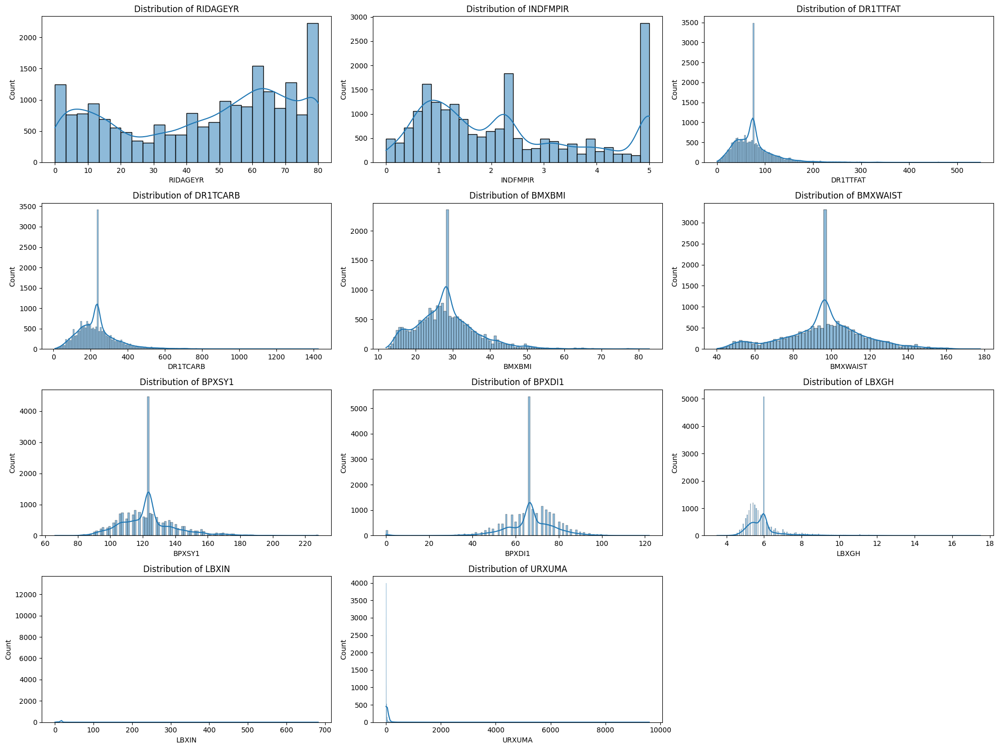

In [41]:
continuous_vars = ['RIDAGEYR', 'INDFMPIR', 'DR1TTFAT', 'DR1TCARB',
                   'BMXBMI', 'BMXWAIST', 'BPXSY1', 'BPXDI1',
                   'LBXGH', 'LBXIN', 'URXUMA']

plt.figure(figsize=(20, 15))
for i, col in enumerate(continuous_vars, 1):
    plt.subplot(4, 3, i)
    sns.histplot(merged_df[col].dropna(), kde=True)
    plt.title(f'Distribution of {col}')
plt.tight_layout()
plt.show()

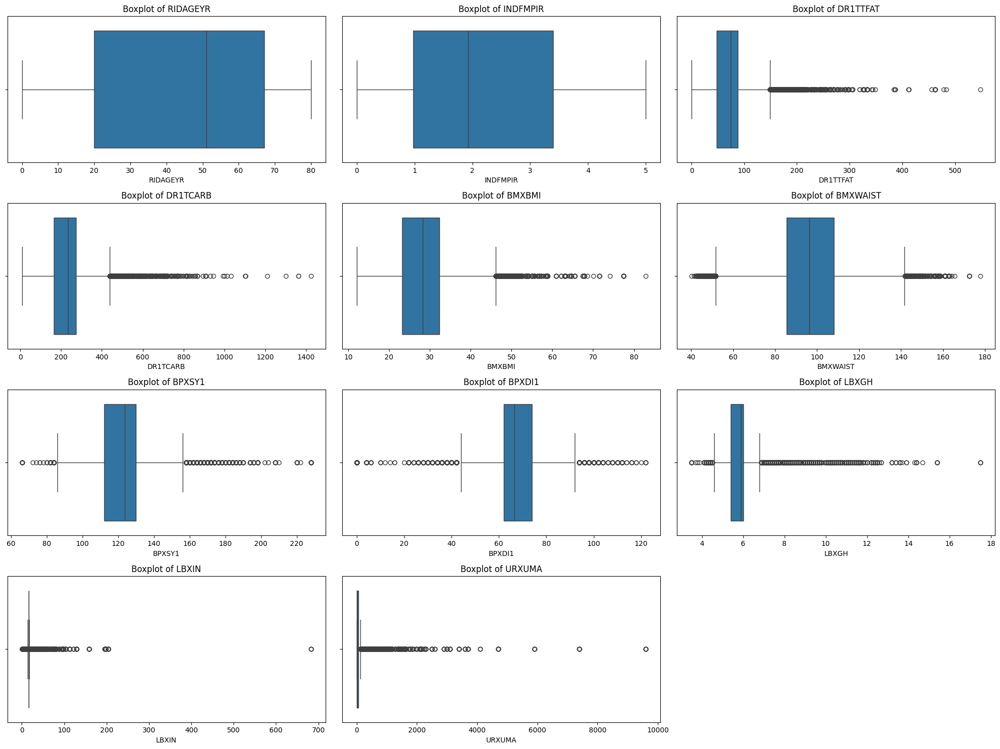

In [42]:
# Plot boxplots
plt.figure(figsize=(20, 15))
for i, col in enumerate(continuous_vars, 1):
    plt.subplot(4, 3, i)
    sns.boxplot(x=merged_df[col].dropna())
    plt.title(f'Boxplot of {col}')
plt.tight_layout()
plt.show()

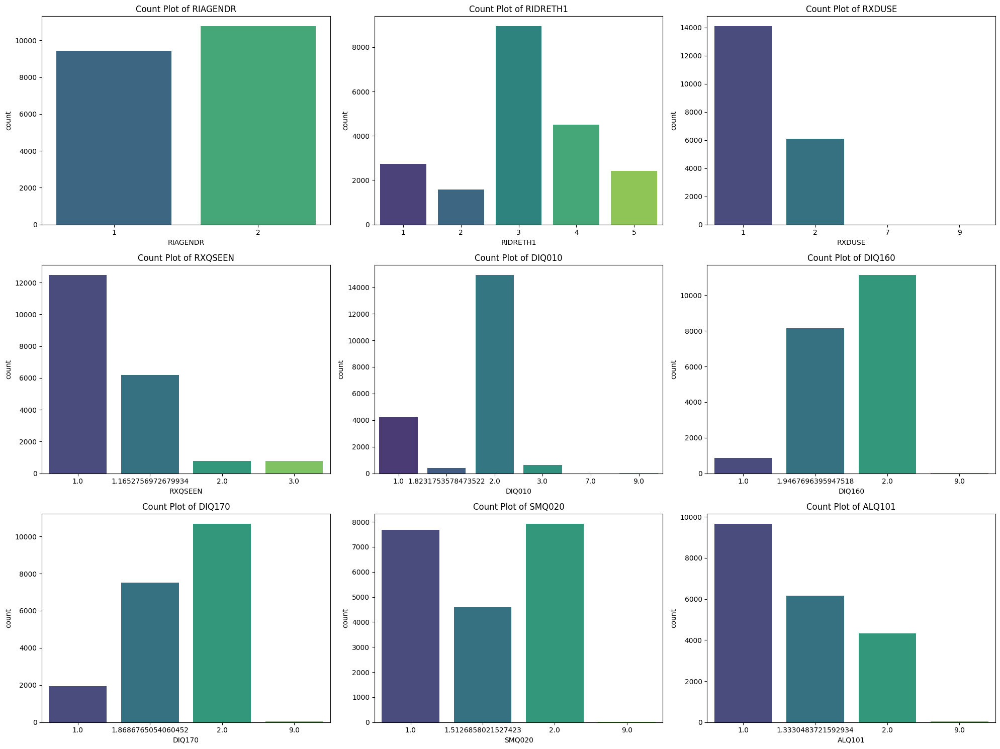

In [43]:
categorical_vars = ['RIAGENDR', 'RIDRETH1', 'RXDUSE', 'RXQSEEN',
                    'DIQ010', 'DIQ160', 'DIQ170', 'SMQ020', 'ALQ101']

# Plot count plots
plt.figure(figsize=(20, 15))
for i, col in enumerate(categorical_vars, 1):
    plt.subplot(3, 3, i)
    sns.countplot(x=merged_df[col], palette='viridis')
    plt.title(f'Count Plot of {col}')
plt.tight_layout()
plt.show()

In [44]:
summary_stats = merged_df[continuous_vars].describe()
print(summary_stats)

           RIDAGEYR      INDFMPIR      DR1TTFAT      DR1TCARB        BMXBMI  \
count  20194.000000  20194.000000  20194.000000  20194.000000  20194.000000   
mean      45.373329      2.266655     74.612997    234.928617     28.415333   
std       25.661984      1.542620     42.079311    111.157232      8.208375   
min        0.000000      0.000000      0.000000      8.670000     12.100000   
25%       20.000000      0.980000     47.440000    164.377500     23.200000   
50%       51.000000      1.930000     74.410000    234.928617     28.300000   
75%       67.000000      3.400000     88.010000    274.240000     32.400000   
max       80.000000      5.000000    548.380000   1423.870000     82.900000   

           BMXWAIST        BPXSY1        BPXDI1         LBXGH         LBXIN  \
count  20194.000000  20194.000000  20194.000000  20194.000000  20194.000000   
mean      96.306345    123.534538     66.623712      5.986091     16.393365   
std       21.085727     17.447779     12.981578    

Key Steps in Bivariate Analysis:

Continuous vs. Continuous: Use scatter plots and correlation coefficients to examine relationships between two continuous variables.
Categorical vs. Continuous: Use box plots or violin plots to explore how a continuous variable varies across different categories.
Categorical vs. Categorical: Use cross-tabulations, heatmaps, or bar plots to explore the relationship between two categorical variables.

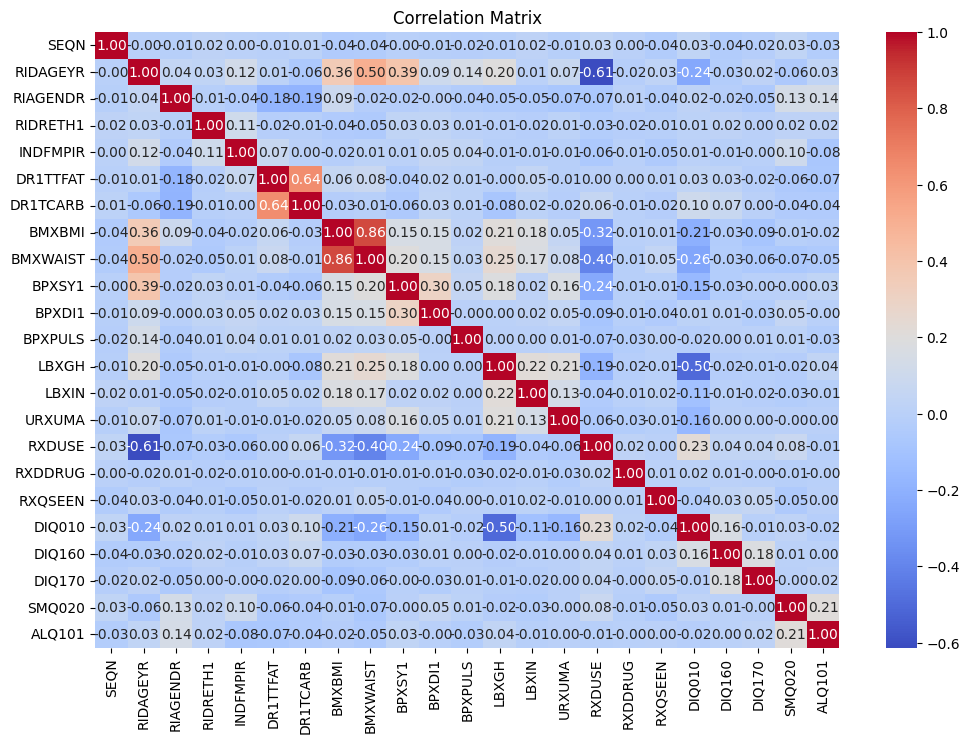

In [45]:
import seaborn as sns
import matplotlib.pyplot as plt

# Correlation matrix
plt.figure(figsize=(12, 8))
sns.heatmap(merged_df.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

Continuous vs. Continuous: 


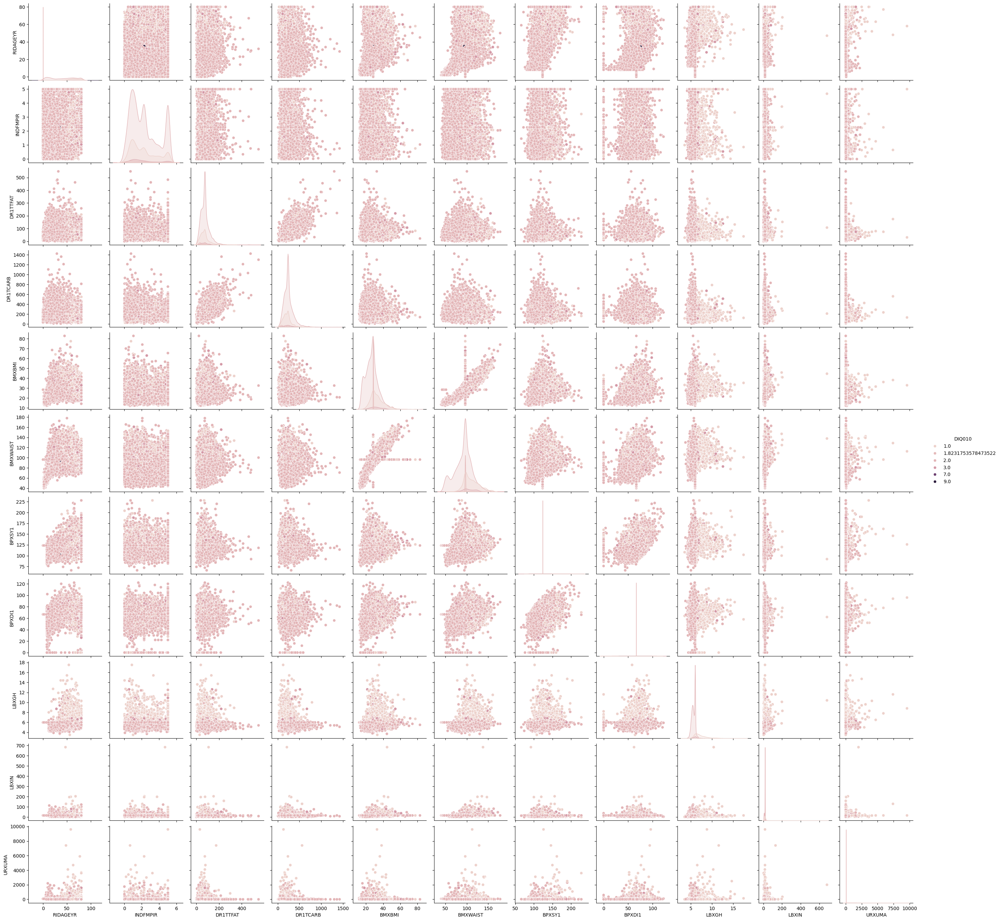

In [46]:
sns.pairplot(merged_df, vars=continuous_vars, hue='DIQ010', diag_kind='kde')
print("Continuous vs. Continuous: ")
plt.show()

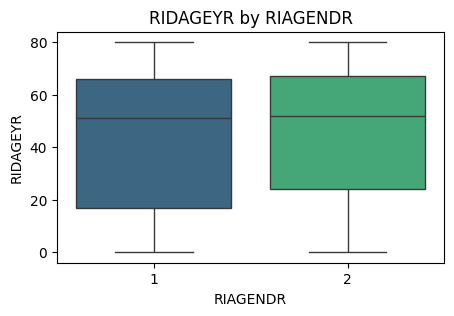

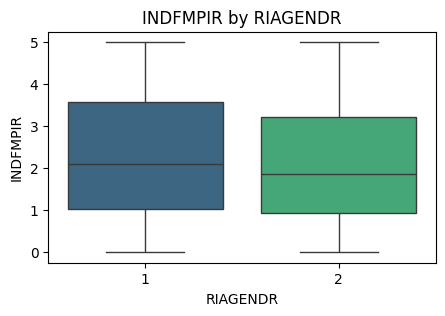

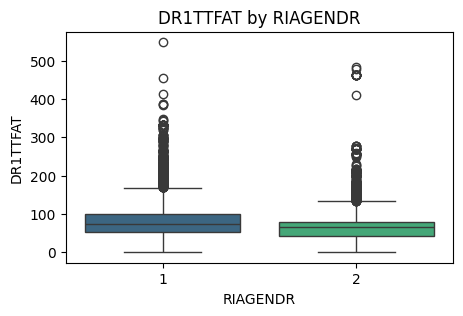

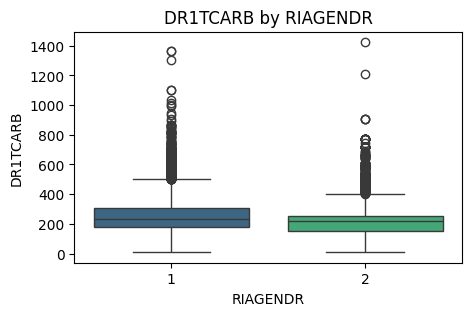

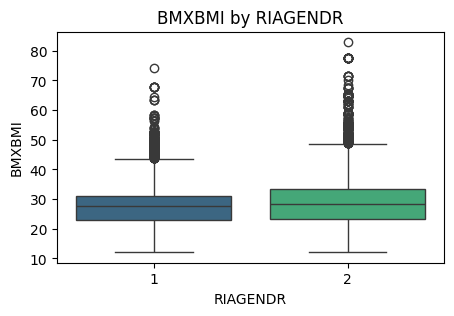

...

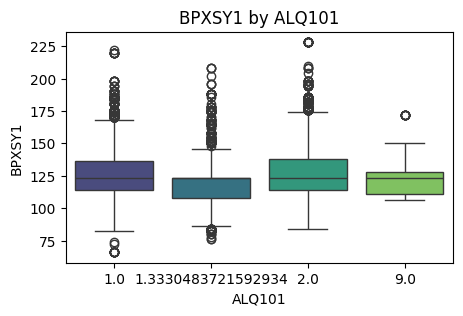

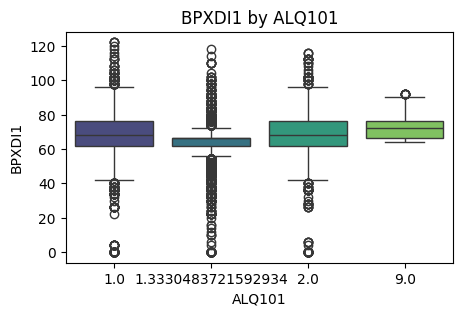

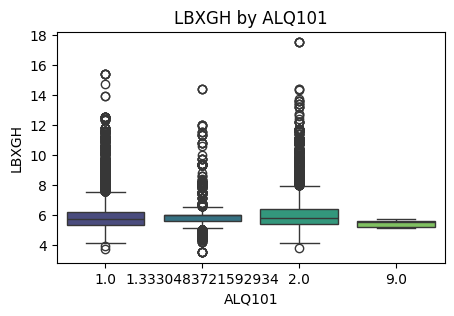

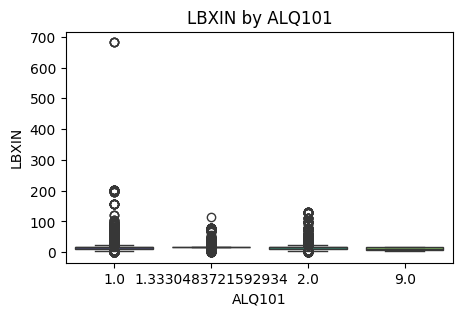

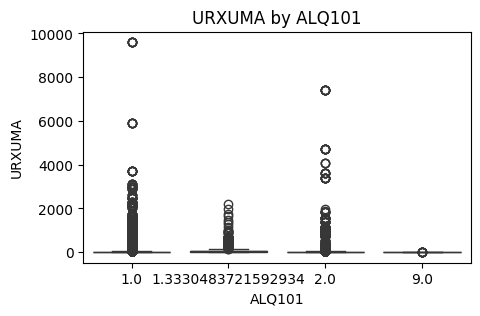

In [47]:
for cat_col in categorical_vars:
    for cont_col in continuous_vars:
        plt.figure(figsize=(5, 3))
        sns.boxplot(x=merged_df[cat_col], y=merged_df[cont_col], palette='viridis')
        plt.title(f'{cont_col} by {cat_col}')
        plt.show()

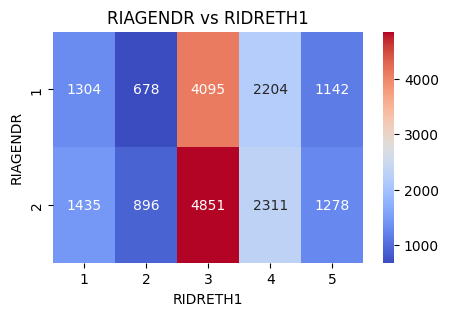

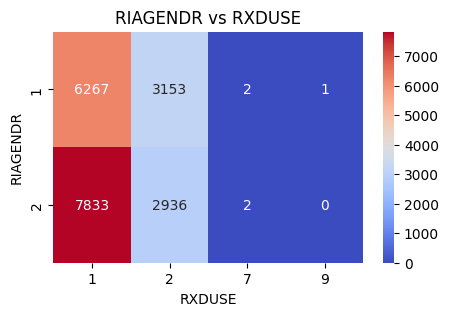

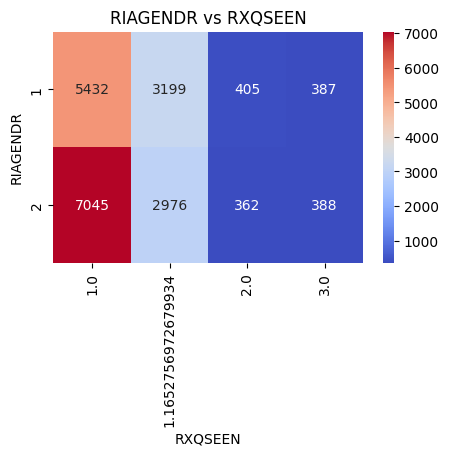

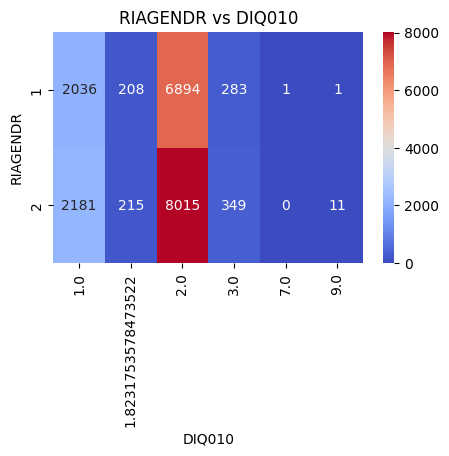

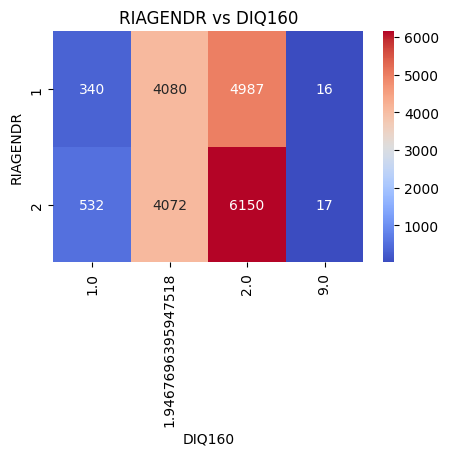

...

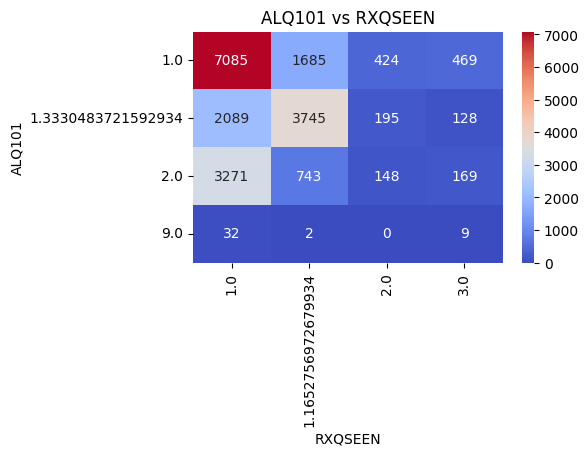

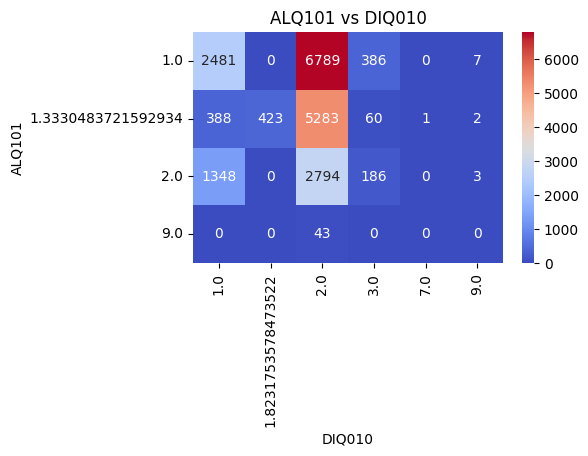

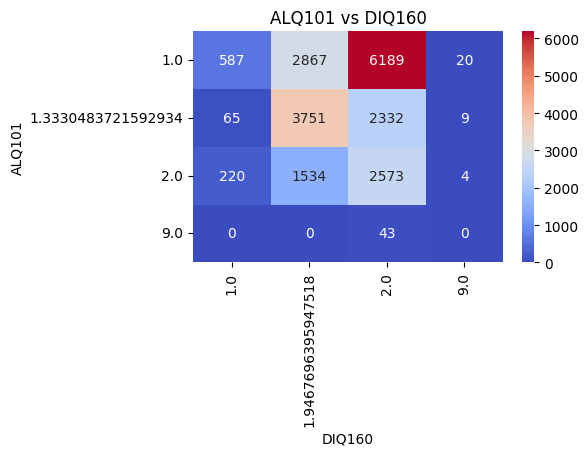

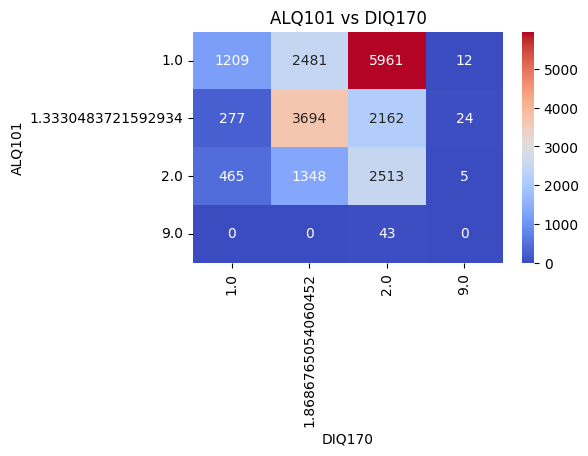

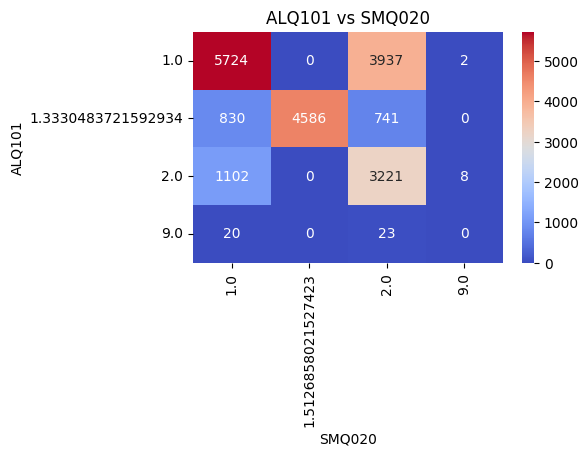

In [48]:
for cat_col1 in categorical_vars:
    for cat_col2 in categorical_vars:
        if cat_col1 != cat_col2:
            crosstab = pd.crosstab(merged_df[cat_col1], merged_df[cat_col2])
            plt.figure(figsize=(5, 3))
            sns.heatmap(crosstab, annot=True, cmap='coolwarm', fmt='d')
            plt.title(f'{cat_col1} vs {cat_col2}')
            plt.show()

In [49]:
# Handling categorical variables (One-Hot Encoding)
categorical_features = ['RIAGENDR', 'RIDRETH1', 'RXDUSE', 'RXQSEEN', 'DIQ160', 'DIQ170', 'SMQ020', 'ALQ101']
one_hot_encoder = OneHotEncoder(drop='first')

# Scaling continuous features
continuous_features = ['RIDAGEYR', 'INDFMPIR', 'DR1TTFAT', 'DR1TCARB', 'BMXBMI', 'BMXWAIST', 'BPXSY1', 'BPXDI1', 'LBXGH', 'LBXIN', 'URXUMA']
scaler = StandardScaler()

# Creating a ColumnTransformer to apply transformations
preprocessor = ColumnTransformer(
    transformers=[
        ('cat', one_hot_encoder, categorical_features),
        ('num', scaler, continuous_features)
    ])

# Applying transformations
merged_df_transformed = preprocessor.fit_transform(merged_df)

# Adding new features
merged_df['BMI_Category'] = pd.cut(merged_df['BMXBMI'], bins=[0, 18.5, 24.9, 29.9, np.inf], labels=['Underweight', 'Normal', 'Overweight', 'Obese'])
merged_df['Age_Group'] = pd.cut(merged_df['RIDAGEYR'], bins=[0, 18, 35, 50, 65, np.inf], labels=['Child', 'Young Adult', 'Adult', 'Middle-Aged', 'Senior'])
merged_df['Hypertension'] = np.where((merged_df['BPXSY1'] > 130) | (merged_df['BPXDI1'] > 80), 1, 0)

# Example of feature interaction
merged_df['BMI_Waist'] = merged_df['BMXBMI'] * merged_df['BMXWAIST']
merged_df['Chol_Gluc_Interaction'] = merged_df['LBXGH'] * merged_df['LBXIN']

# Log transformation
merged_df['Log_Waist'] = np.log1p(merged_df['BMXWAIST'])
merged_df['Log_Glucose'] = np.log1p(merged_df['LBXIN'])

# Display the updated DataFrame
print(merged_df.head())

    SEQN  RIDAGEYR  RIAGENDR  RIDRETH1  INDFMPIR  DR1TTFAT  DR1TCARB  BMXBMI  \
0  73557        69         1         4      0.84     52.81    239.59    26.7   
1  73557        69         1         4      0.84     52.81    239.59    26.7   
2  73558        54         1         3      1.78    124.29    423.78    28.6   
3  73558        54         1         3      1.78    124.29    423.78    28.6   
4  73558        54         1         3      1.78    124.29    423.78    28.6   

   BMXWAIST  BPXSY1  ...    DIQ170  SMQ020  ALQ101  BMI_Category    Age_Group  \
0     100.0   122.0  ...  1.868677     1.0     1.0    Overweight       Senior   
1     100.0   122.0  ...  1.868677     1.0     1.0    Overweight       Senior   
2     107.6   156.0  ...  1.868677     1.0     1.0    Overweight  Middle-Aged   
3     107.6   156.0  ...  1.868677     1.0     1.0    Overweight  Middle-Aged   
4     107.6   156.0  ...  1.868677     1.0     1.0    Overweight  Middle-Aged   

   Hypertension  BMI_Waist  Chol

In [50]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Step 1: Load and Prepare Data
# Selecting features
X = merged_df[['RIDAGEYR', 'BMXBMI', 'BMXWAIST', 'LBXGH', 'LBXIN',
               'DR1TTFAT', 'DR1TCARB', 'INDFMPIR', 'BPXSY1', 'BPXDI1']]

# Encoding the target variable
y = merged_df['DIQ010'].copy()
y = y.apply(lambda x: 1 if x == 1 else 0 if x == 2 else None)  # 1 for diabetes, 0 for no diabetes
y = y.dropna()  # Remove rows with NaN values
X = X.loc[y.index]  # Align X with y

# Step 2: Split Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Scale Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Handle Class Imbalance (Optional)
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Step 5: Train and Evaluate Decision Tree Model
dt_model = DecisionTreeClassifier(random_state=42)
dt_model.fit(X_resampled, y_resampled)

# Make predictions
y_pred = dt_model.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Decision Tree Accuracy: {accuracy:.2f}")
print(classification_report(y_test, y_pred))

Decision Tree Accuracy: 0.98
              precision    recall  f1-score   support

         0.0       1.00      0.98      0.99      2990
         1.0       0.93      0.99      0.96       836

    accuracy                           0.98      3826
   macro avg       0.97      0.99      0.98      3826
weighted avg       0.98      0.98      0.98      3826



In [51]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Step 1: Load and Prepare Data
# Selecting features
X = merged_df[['RIDAGEYR', 'BMXBMI', 'BMXWAIST', 'LBXGH', 'LBXIN',
               'DR1TTFAT', 'DR1TCARB', 'INDFMPIR', 'BPXSY1', 'BPXDI1']]

# Encoding the target variable
y = merged_df['DIQ010'].copy()
y = y.apply(lambda x: 1 if x == 1 else 0 if x == 2 else None)  # 1 for diabetes, 0 for no diabetes
y = y.dropna()  # Remove rows with NaN values
X = X.loc[y.index]  # Align X with y

# Step 2: Split Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Scale Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Handle Class Imbalance (Optional)
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Step 5: Train and Evaluate Random Forest Model
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_resampled, y_resampled)

# Make predictions
y_pred = rf_model.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Random Forest Accuracy: {accuracy:.2f}")
print(classification_report(y_test, y_pred))

Random Forest Accuracy: 0.99
              precision    recall  f1-score   support

         0.0       1.00      0.99      1.00      2990
         1.0       0.98      0.99      0.99       836

    accuracy                           0.99      3826
   macro avg       0.99      0.99      0.99      3826
weighted avg       0.99      0.99      0.99      3826



In [52]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score
from imblearn.over_sampling import SMOTE

# Step 1: Load and Prepare Data
# Selecting features
X = merged_df[['RIDAGEYR', 'BMXBMI', 'BMXWAIST', 'LBXGH', 'LBXIN',
               'DR1TTFAT', 'DR1TCARB', 'INDFMPIR', 'BPXSY1', 'BPXDI1']]

# Encoding the target variable
y = merged_df['DIQ010'].copy()
y = y.apply(lambda x: 1 if x == 1 else 0 if x == 2 else None)  # 1 for diabetes, 0 for no diabetes
y = y.dropna()  # Remove rows with NaN values
X = X.loc[y.index]  # Align X with y

# Step 2: Split Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 3: Scale Features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Step 4: Handle Class Imbalance
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train_scaled, y_train)

# Step 5: Train and Evaluate Logistic Regression Model
print("\nLogistic Regression:")
log_reg = LogisticRegression(max_iter=2000, class_weight='balanced', random_state=42)
log_reg.fit(X_resampled, y_resampled)

# Make predictions
y_pred = log_reg.predict(X_test_scaled)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.2f}")
print(classification_report(y_test, y_pred))


Logistic Regression:
Accuracy: 0.86
              precision    recall  f1-score   support

         0.0       0.96      0.86      0.91      2990
         1.0       0.64      0.87      0.74       836

    accuracy                           0.86      3826
   macro avg       0.80      0.86      0.82      3826
weighted avg       0.89      0.86      0.87      3826



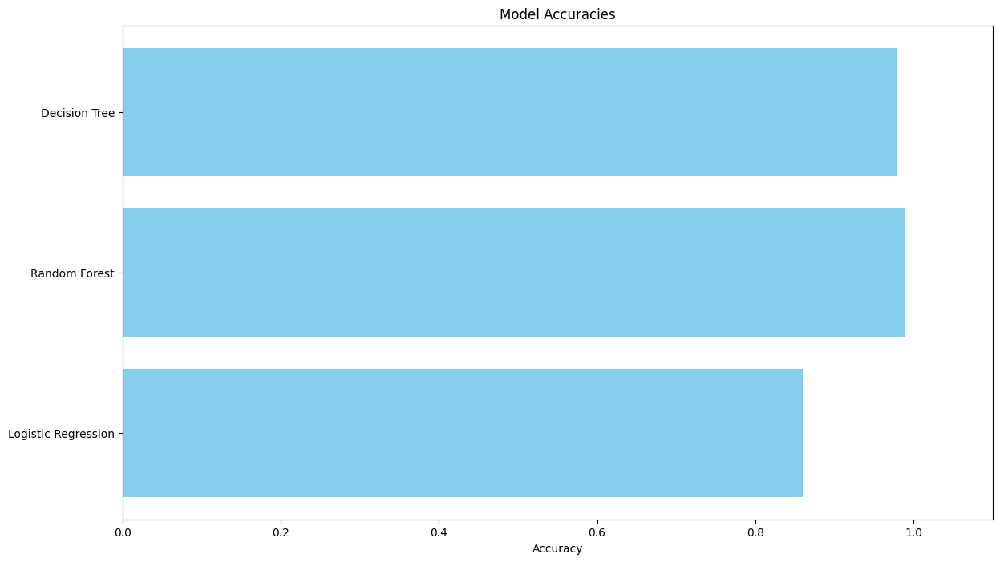

In [53]:
import matplotlib.pyplot as plt

# Dictionary of accuracies for different models
accuracies = {
    'Decision Tree': 0.98,
    'Random Forest': 0.99,
    'Logistic Regression': 0.86,
}

# Convert the dictionary to lists for plotting
models = list(accuracies.keys())
scores = list(accuracies.values())

# Plotting the bar chart
plt.figure(figsize=(14, 8))
plt.barh(models, scores, color='skyblue')
plt.xlabel('Accuracy')
plt.title('Model Accuracies')
plt.xlim(0, 1.1)  # Set x-axis limit from 0 to 1.1 to give some space for the bars
plt.gca().invert_yaxis()  # To display the highest accuracy at the top
plt.show()

In [56]:
import pandas as pd

# Load the merged dataset
merged = pd.read_csv('/content/merged.csv', encoding='latin1')

# Extract Type-2 Diabetes related features (only those present in merged.csv)
t2d_features = [
    'RIDAGEYR','RIAGENDR','RIDRETH1','INDFMPIR',
    'DR1TTFAT','DR1TCARB',
    'BMXBMI','BMXWAIST','BPXSY1','BPXDI1','BPXPULS',
    'LBXGH','LBXIN','URXUMA','Log_Glucose',
    'RXDUSE','RXDDRUG','RXQSEEN',
    'DIQ010','DIQ160','DIQ170','SMQ020','ALQ101',
    'BMI_Category','Age_Group','Hypertension',
    'BMI_Waist','Chol_Gluc_Interaction','Log_Waist'
]

selected_features = merged[t2d_features]

# Save the new DataFrame to a CSV file
selected_features.to_csv('/content/type2_features.csv', index=False)

print("Type-2 Diabetes Features saved successfully.")


Type-2 Diabetes Features saved successfully.


In [57]:
# Drop rows with missing values in the selected features
df_clean = selected_features.dropna(subset=[
    'RIDAGEYR','RIAGENDR','RIDRETH1','INDFMPIR',
    'DR1TTFAT','DR1TCARB',
    'BMXBMI','BMXWAIST','BPXSY1','BPXDI1','BPXPULS',
    'LBXGH','LBXIN','URXUMA','Log_Glucose',
    'RXDUSE','RXDDRUG','RXQSEEN',
    'DIQ010','DIQ160','DIQ170','SMQ020','ALQ101',
    'BMI_Category','Age_Group','Hypertension',
    'BMI_Waist','Chol_Gluc_Interaction','Log_Waist'
])

print(df_clean.isnull().sum())

RIDAGEYR                 0
RIAGENDR                 0
RIDRETH1                 0
INDFMPIR                 0
DR1TTFAT                 0
DR1TCARB                 0
BMXBMI                   0
BMXWAIST                 0
BPXSY1                   0
BPXDI1                   0
BPXPULS                  0
LBXGH                    0
LBXIN                    0
URXUMA                   0
Log_Glucose              0
RXDUSE                   0
RXDDRUG                  0
RXQSEEN                  0
DIQ010                   0
DIQ160                   0
DIQ170                   0
SMQ020                   0
ALQ101                   0
BMI_Category             0
Age_Group                0
Hypertension             0
BMI_Waist                0
Chol_Gluc_Interaction    0
Log_Waist                0
dtype: int64


In [58]:
_summary = df_clean.describe()
print(_summary)

           RIDAGEYR      RIAGENDR      RIDRETH1      INDFMPIR      DR1TTFAT  \
count  19772.000000  19772.000000  19772.000000  19772.000000  19772.000000   
mean      46.341746      1.533886      3.117945      2.272667     75.182274   
std       25.054203      0.498863      1.141298      1.543458     42.220947   
min        1.000000      1.000000      1.000000      0.000000      0.000000   
25%       23.000000      1.000000      3.000000      0.990000     47.995000   
50%       52.000000      2.000000      3.000000      1.940000     74.560000   
75%       67.000000      2.000000      4.000000      3.400000     88.590000   
max       80.000000      2.000000      5.000000      5.000000    548.380000   

           DR1TCARB        BMXBMI      BMXWAIST        BPXSY1        BPXDI1  \
count  19772.000000  19772.000000  19772.000000  19772.000000  19772.000000   
mean     236.807336     28.415333     96.306345    123.534538     66.623712   
std      111.060952      8.295514     21.309570    

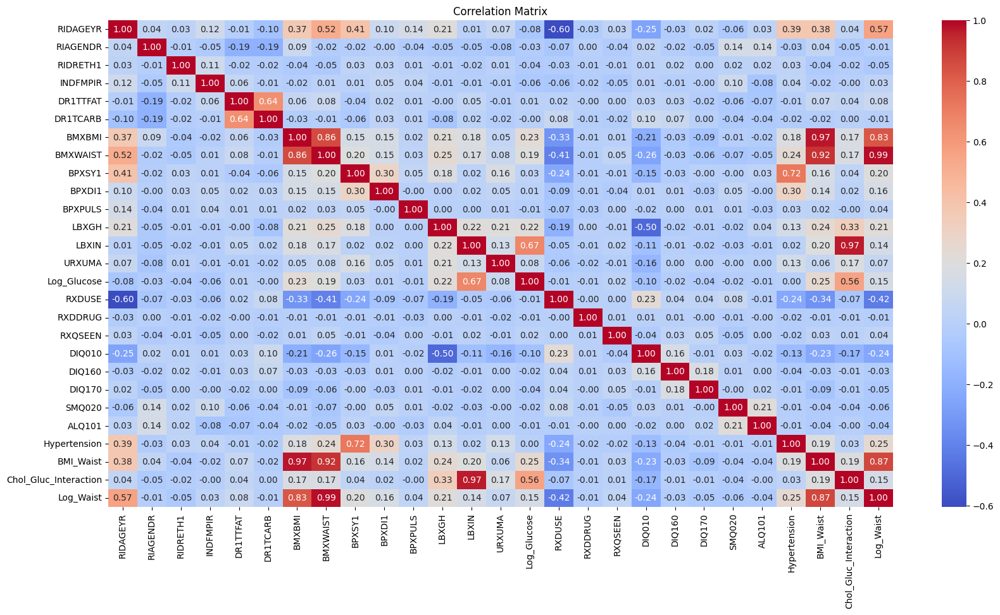

In [59]:
# Select only numeric columns for correlation calculation
numeric_df_clean = df_clean.select_dtypes(include=np.number)
import seaborn as sns
import matplotlib.pyplot as plt

# Correlation matrix
plt.figure(figsize=(20, 10))
sns.heatmap(numeric_df_clean.corr(), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix')
plt.show()

In [60]:
import matplotlib.pyplot as plt

# Define features by category
lab_features = {
    'LBXGH': 'HbA1c (%)',
    'LBXIN': 'Insulin (uU/mL)',
    'Log_Glucose': 'Log(Glucose)',
    'URXUMA': 'Urinary Albumin'
}

exam_features = {
    'BMXBMI': 'Body Mass Index (BMI)',
    'BMXWAIST': 'Waist Circumference (cm)',
    'BPXSY1': 'Systolic Blood Pressure (mmHg)',
    'BPXDI1': 'Diastolic Blood Pressure (mmHg)',
    'BPXPULS': 'Pulse (beats/min)'
}

diet_features = {
    'DR1TTFAT': 'Total Fat Intake (g)',
    'DR1TCARB': 'Total Carbohydrate Intake (g)'
}

demo_features = {
    'RIDAGEYR': 'Age (years)',
    'INDFMPIR': 'Income-to-Poverty Ratio'
}


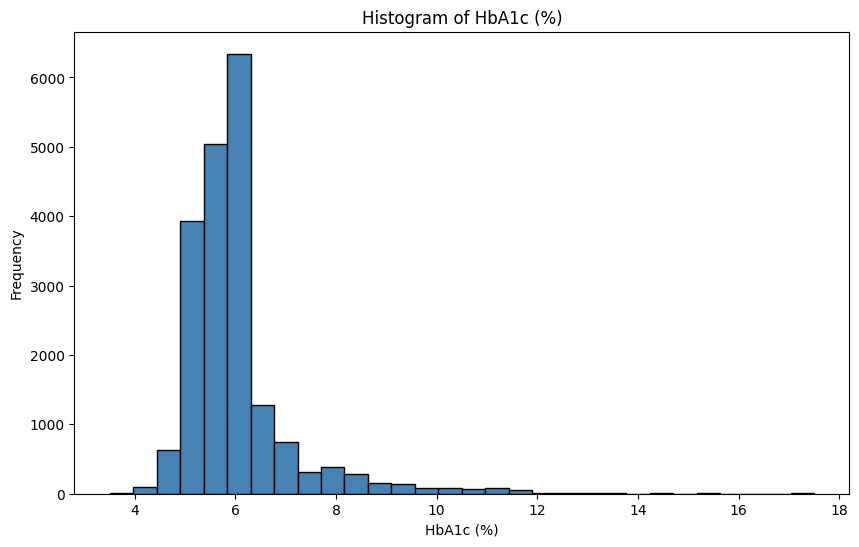

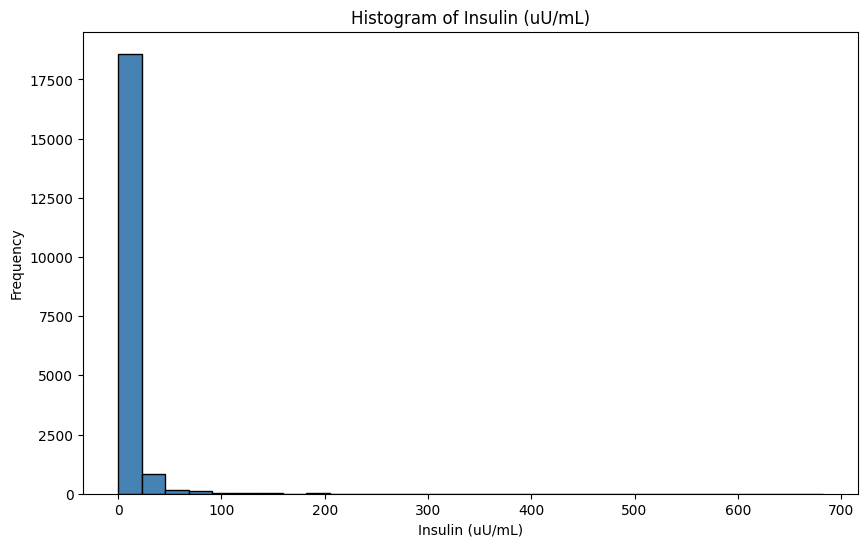

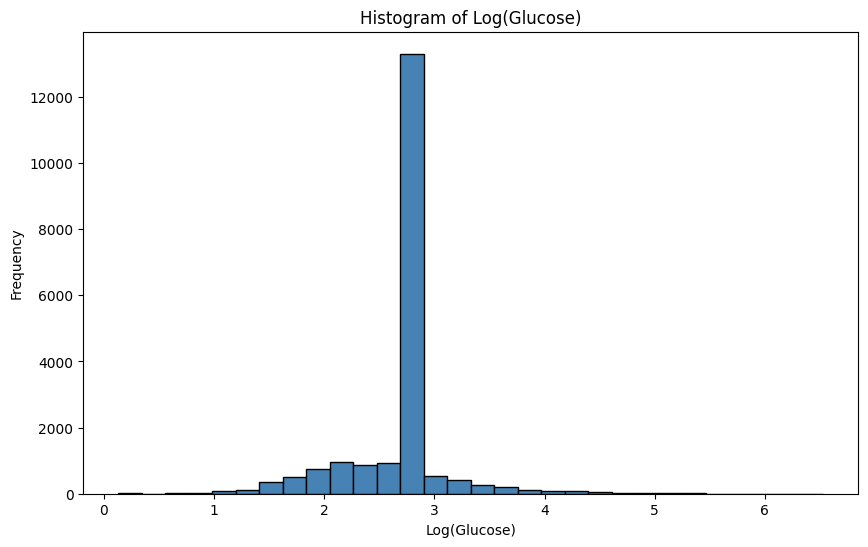

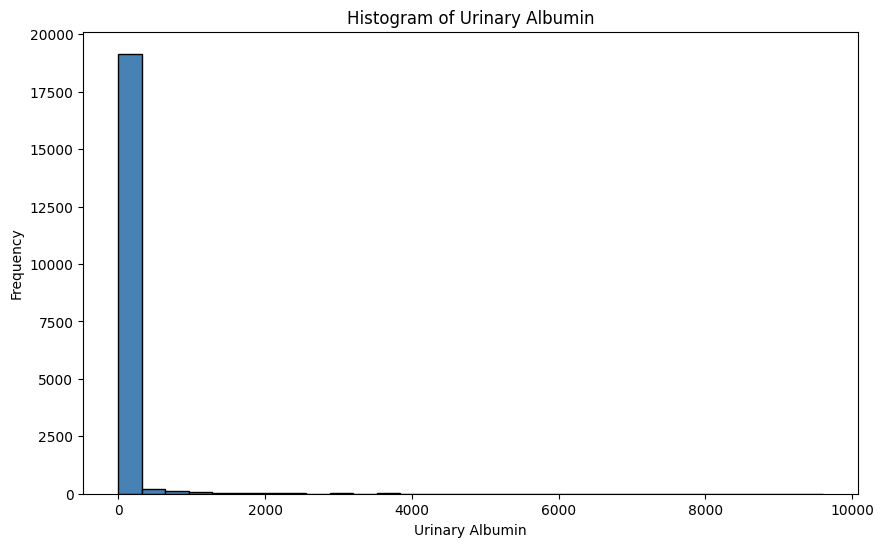

In [62]:
# Plot histograms for lab features
for col, label in lab_features.items():
    if col in df_clean.columns:
        plt.figure(figsize=(10, 6))
        plt.hist(df_clean[col].dropna(), bins=30, color='steelblue', edgecolor='black')
        plt.title(f'Histogram of {label}')
        plt.xlabel(label)
        plt.ylabel('Frequency')
        plt.show()

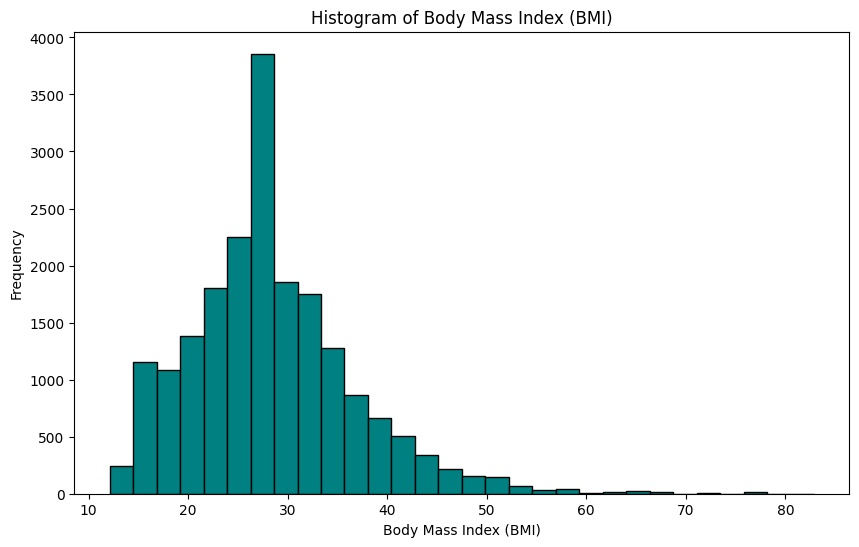

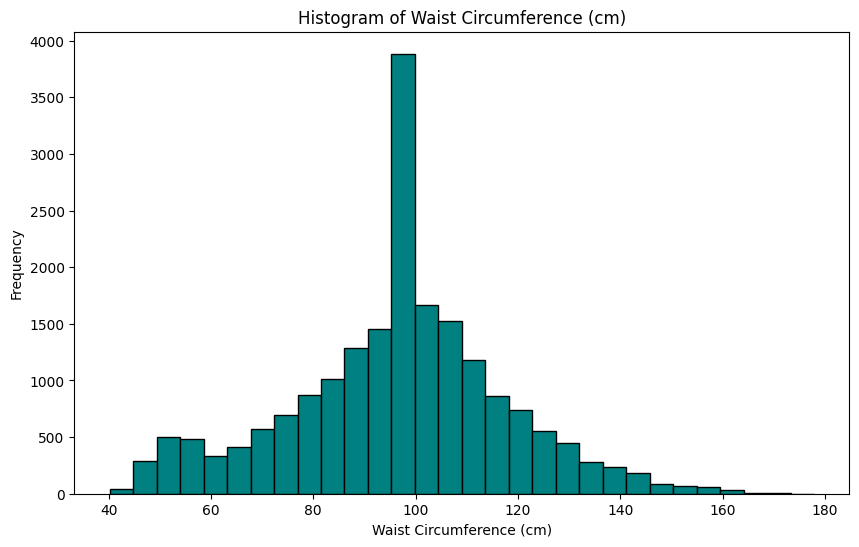

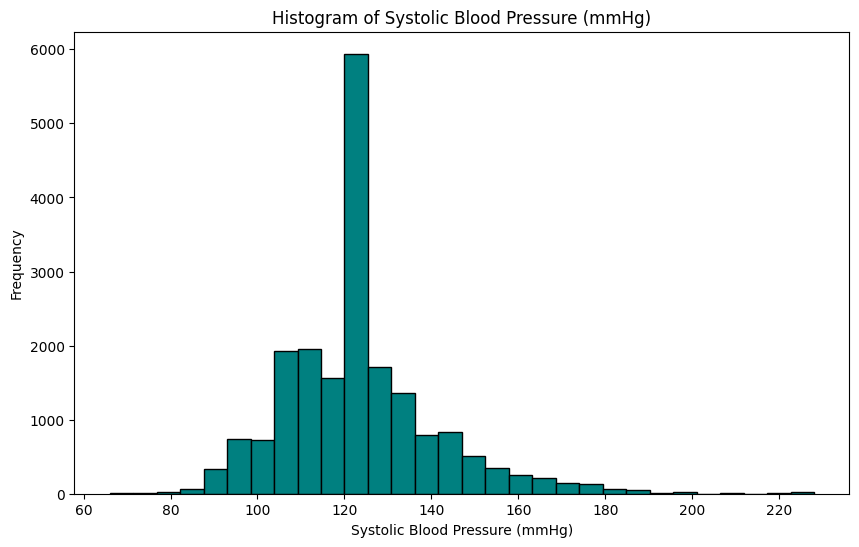

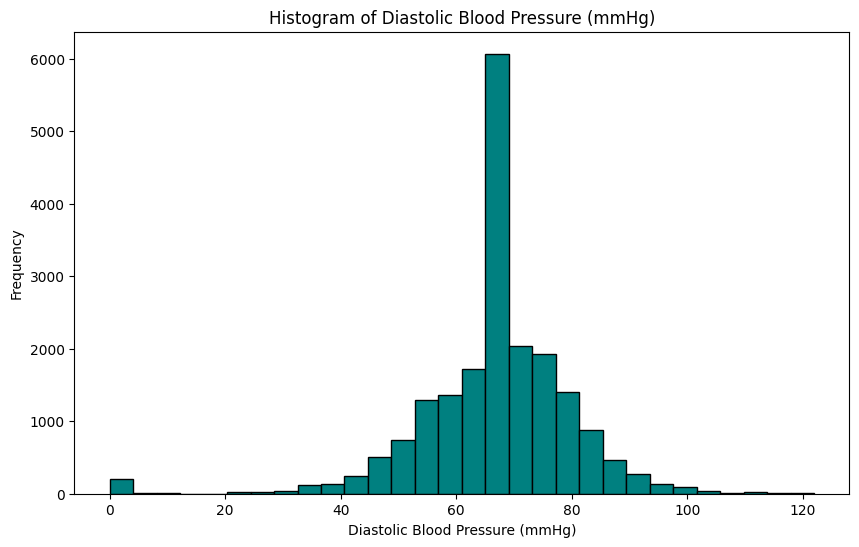

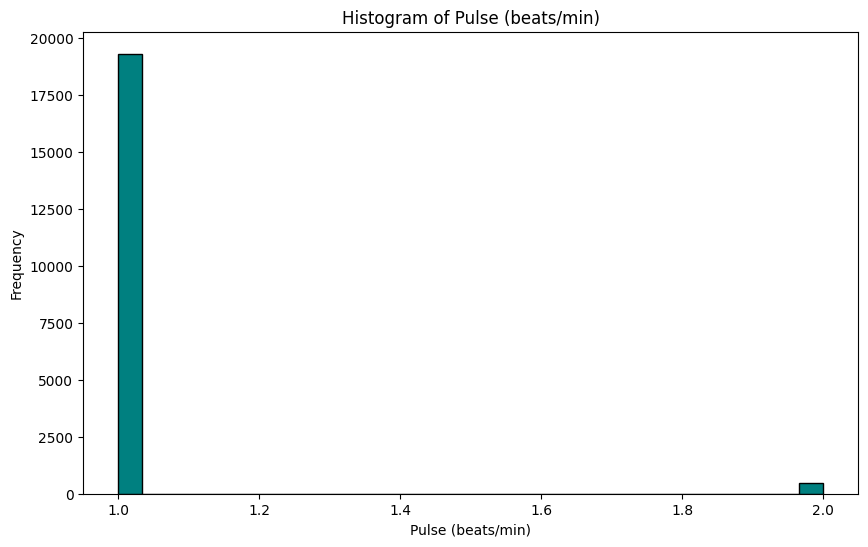

In [65]:
# Plot histograms for exam features
for col, label in exam_features.items():
    if col in df_clean.columns:
        plt.figure(figsize=(10, 6))
        plt.hist(df_clean[col].dropna(), bins=30, color='teal', edgecolor='black')
        plt.title(f'Histogram of {label}')
        plt.xlabel(label)
        plt.ylabel('Frequency')
        plt.show()

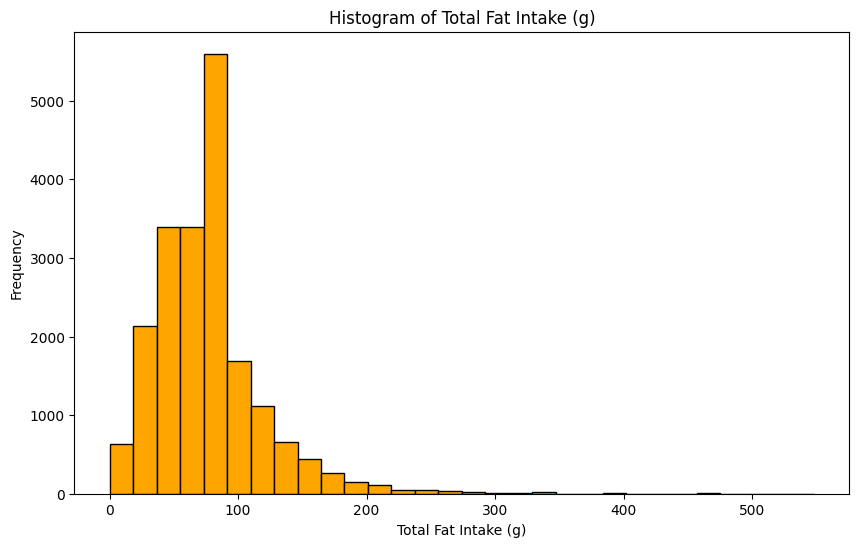

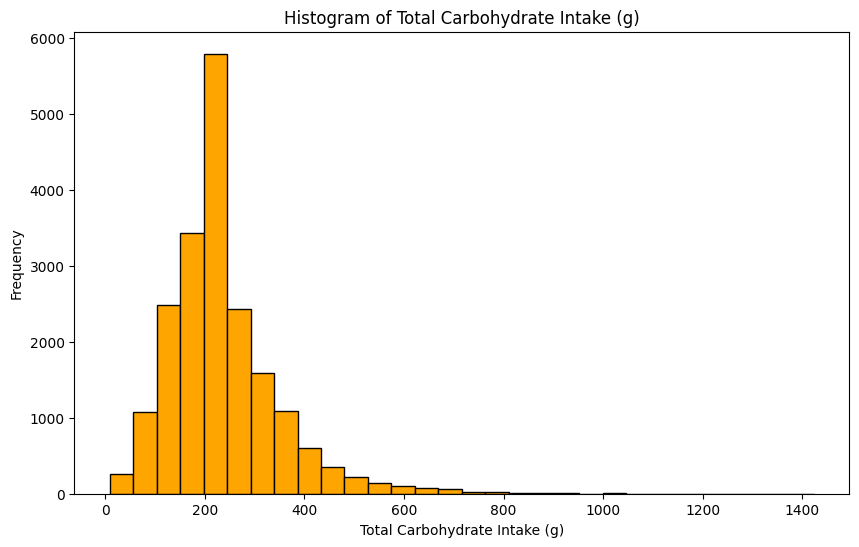

In [66]:
# Plot histograms for diet features
for col, label in diet_features.items():
    if col in df_clean.columns:
        plt.figure(figsize=(10, 6))
        plt.hist(df_clean[col].dropna(), bins=30, color='orange', edgecolor='black')
        plt.title(f'Histogram of {label}')
        plt.xlabel(label)
        plt.ylabel('Frequency')
        plt.show()

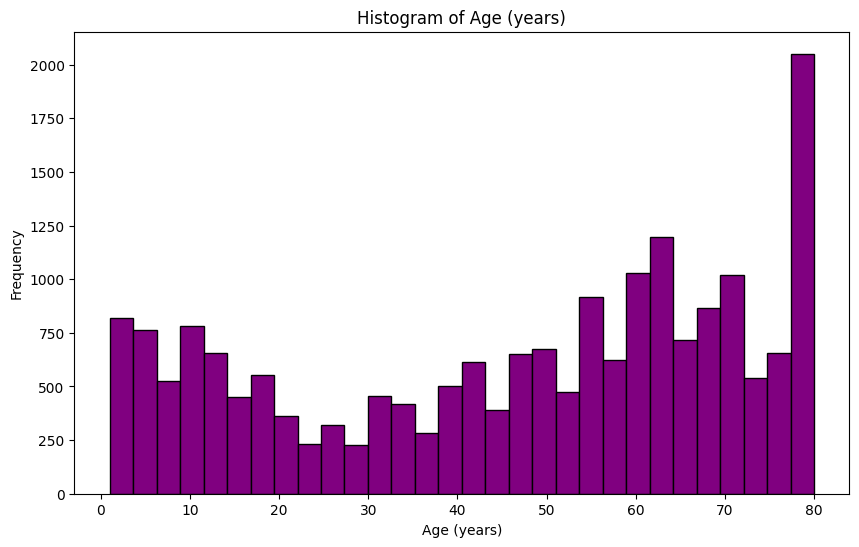

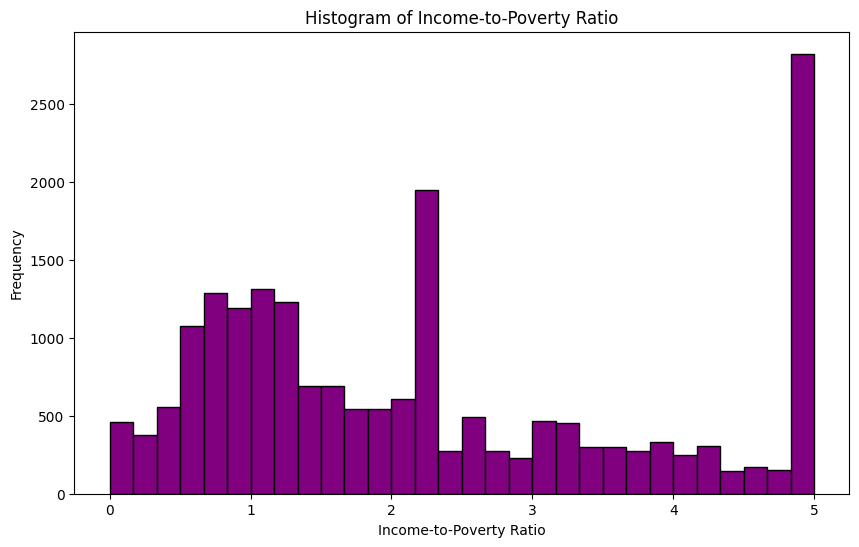

In [67]:
# Plot histograms for demographic features
for col, label in demo_features.items():
    if col in df_clean.columns:
        plt.figure(figsize=(10, 6))
        plt.hist(df_clean[col].dropna(), bins=30, color='purple', edgecolor='black')
        plt.title(f'Histogram of {label}')
        plt.xlabel(label)
        plt.ylabel('Frequency')
        plt.show()

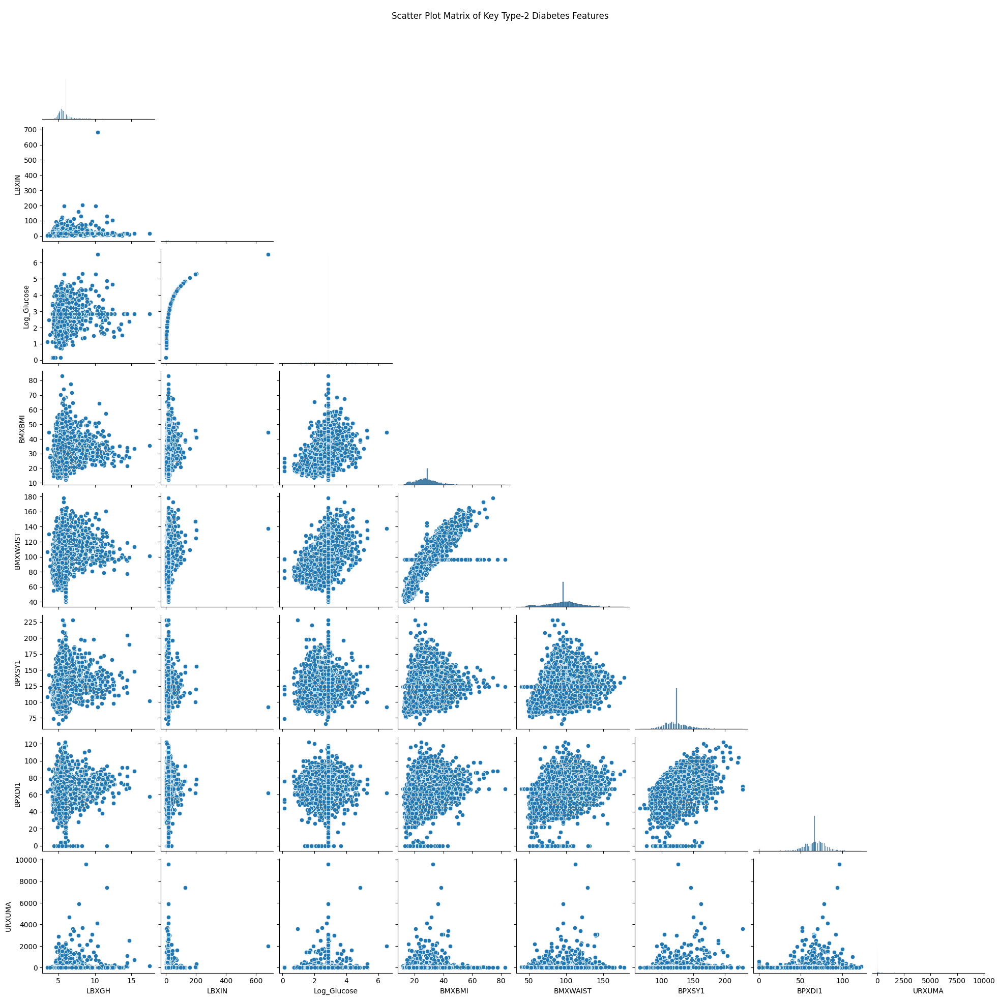

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select important Type-2 Diabetes features for pairplot
pairplot_features = [
    'LBXGH',          # HbA1c
    'LBXIN',          # Insulin
    'Log_Glucose',    # Log-transformed glucose
    'BMXBMI',         # BMI
    'BMXWAIST',       # Waist circumference
    'BPXSY1',         # Systolic BP
    'BPXDI1',         # Diastolic BP
    'URXUMA'          # Urinary albumin
]

# Keep only features that exist in the dataset
available_features = [f for f in pairplot_features if f in df_clean.columns]

# Create scatter plot matrix
sns.pairplot(df_clean[available_features], diag_kind='hist', corner=True)
plt.suptitle('Scatter Plot Matrix of Key Type-2 Diabetes Features')
plt.show()


In [69]:
df_clean.to_csv('/content/t2d_clean', index=False)

print(f"T2D Cleaned DataFrame saved")

T2D Cleaned DataFrame saved


In [70]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score

file_path = '/content/t2d_clean'
df = pd.read_csv(file_path, encoding='latin1')

# HbA1c ≥ 6.5% (diagnostic threshold)
df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= 6.5).astype(int)
df['InsulinAboveThreshold'] = (df['LBXIN'] >= 25).astype(int)

# Glucose: if raw 'LBXSGL' exists use it, else use 'Log_Glucose' with ln(126 mg/dL) ≈ 4.836
if 'LBXSGL' in df.columns:
    df['GlucoseAboveThreshold'] = (df['LBXSGL'] >= 126).astype(int)
elif 'Log_Glucose' in df.columns:
    df['GlucoseAboveThreshold'] = (df['Log_Glucose'] >= np.log(126)).astype(int)
else:
    # if neither is available, fall back to zeros so code still runs
    df['GlucoseAboveThreshold'] = 0

has_insulin_col = 'DIQ160' in df.columns  # taking insulin (yes/no)
has_pills_col   = 'DIQ170' in df.columns  # taking diabetes pills (yes/no)

# Mark as T2D if HbA1c>=6.5 OR Glucose high OR on diabetes meds (if cols exist)
rule_pos = (
    (df['GlycohemoglobinAboveThreshold'] == 1) |
    (df['GlucoseAboveThreshold'] == 1) |
    ((df['DIQ160'] == 1) if has_insulin_col else False) |
    ((df['DIQ170'] == 1) if has_pills_col else False)
)

df['Outcome'] = np.where(rule_pos, 1, 0)  # 1 = T2D, 0 = No T2D

base_feats = [
    'GlycohemoglobinAboveThreshold',
    'InsulinAboveThreshold',
    'GlucoseAboveThreshold',
]

extra_feats = [c for c in [
    'RIDAGEYR','RIAGENDR','RIDRETH1','INDFMPIR',   # demographics
    'BMXBMI','BMXWAIST','BPXSY1','BPXDI1','BPXPULS',  # exam
    'URXUMA', 'LBXIN', 'LBXGH', 'Log_Glucose',   # labs
    'DR1TTFAT','DR1TCARB'                        # diet
] if c in df.columns]

X_cols = base_feats + extra_feats
X = df[X_cols].copy()
y = df['Outcome'].astype(int)

mask = X.notnull().all(axis=1) & y.notnull()
X = X.loc[mask]
y = y.loc[mask]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42, stratify=y
)

clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
print("Decision Tree Classifier (T2D detection)")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, digits=3))


Decision Tree Classifier (T2D detection)
Accuracy: 0.9320633850303439
              precision    recall  f1-score   support

           0      0.959     0.947     0.953      4305
           1      0.865     0.892     0.878      1627

    accuracy                          0.932      5932
   macro avg      0.912     0.920     0.915      5932
weighted avg      0.933     0.932     0.932      5932




Confusion Matrix (counts) [rows=true, cols=pred]:
 [[4078  227]
 [ 176 1451]]
TN=4078, FP=227, FN=176, TP=1451


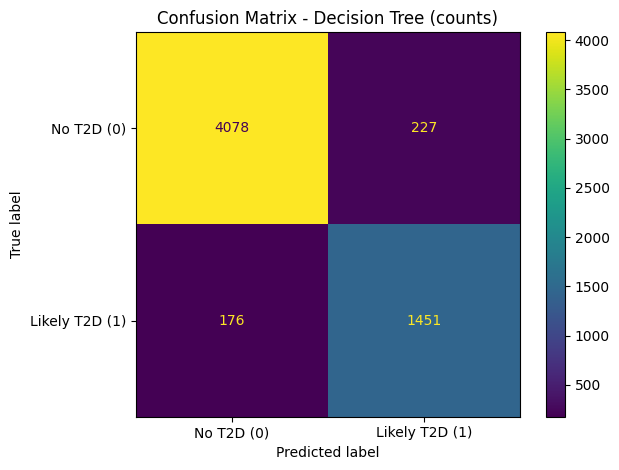

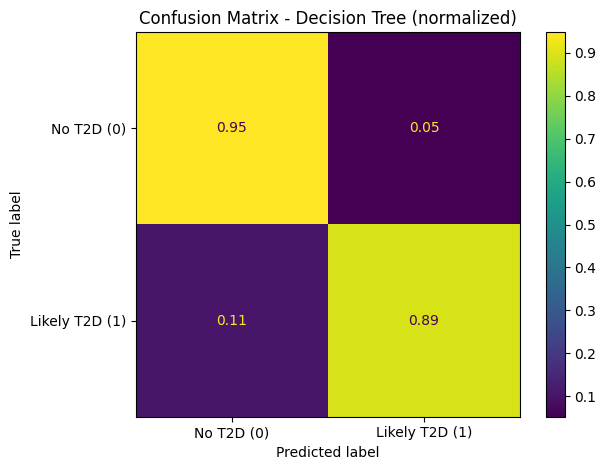

In [72]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Confusion Matrix (counts)
cm = confusion_matrix(y_test, y_pred, labels=[0, 1])
print("\nConfusion Matrix (counts) [rows=true, cols=pred]:\n", cm)
tn, fp, fn, tp = cm.ravel()
print(f"TN={tn}, FP={fp}, FN={fn}, TP={tp}")

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No T2D (0)", "Likely T2D (1)"])
disp.plot(values_format="d")
plt.title("Confusion Matrix - Decision Tree (counts)")
plt.tight_layout()
plt.show()

# Confusion Matrix (normalized by true label)
cm_norm = confusion_matrix(y_test, y_pred, labels=[0, 1], normalize="true")
disp_norm = ConfusionMatrixDisplay(confusion_matrix=cm_norm, display_labels=["No T2D (0)", "Likely T2D (1)"])
disp_norm.plot(values_format=".2f")
plt.title("Confusion Matrix - Decision Tree (normalized)")
plt.tight_layout()
plt.show()

In [73]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score

file_path = '/content/t2d_clean'
df = pd.read_csv(file_path, encoding='latin1')

df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= 6.5).astype(int)

df['InsulinAboveThreshold'] = (df['LBXIN'] >= 25).astype(int)

if 'LBXSGL' in df.columns:
    df['GlucoseAboveThreshold'] = (df['LBXSGL'] >= 126).astype(int)
elif 'Log_Glucose' in df.columns:
    df['GlucoseAboveThreshold'] = (df['Log_Glucose'] >= np.log(126)).astype(int)
else:
    df['GlucoseAboveThreshold'] = 0

# Outcome label for T2D (1 = likely T2D, 0 = no T2D)
rule_pos = (
    (df['GlycohemoglobinAboveThreshold'] == 1) |
    (df['GlucoseAboveThreshold'] == 1) |
    (('DIQ160' in df.columns) and (df['DIQ160'] == 1)) |
    (('DIQ170' in df.columns) and (df['DIQ170'] == 1))
)
df['Outcome'] = np.where(rule_pos, 1, 0).astype(int)

candidate_feats = [
    'GlycohemoglobinAboveThreshold','InsulinAboveThreshold','GlucoseAboveThreshold',
    'RIDAGEYR','RIAGENDR','RIDRETH1','INDFMPIR',
    'BMXBMI','BMXWAIST','BPXSY1','BPXDI1','BPXPULS',
    'URXUMA','LBXIN','LBXGH','Log_Glucose',
    'DR1TTFAT','DR1TCARB'
]
X_cols = [c for c in candidate_feats if c in df.columns]
X = df[X_cols].copy()
y = df['Outcome']

mask = X.notnull().all(axis=1) & y.notnull()
X = X.loc[mask]
y = y.loc[mask]

# Split, train, evaluate
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42, stratify=y
)

clf = RandomForestClassifier(
    n_estimators=300,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    random_state=42,
    n_jobs=-1
)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)

print("Random Forest Classifier (T2D detection)")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, digits=3))


Random Forest Classifier (T2D detection)
Accuracy: 0.9627444369521241
              precision    recall  f1-score   support

           0      0.954     0.997     0.975      4305
           1      0.992     0.872     0.928      1627

    accuracy                          0.963      5932
   macro avg      0.973     0.934     0.951      5932
weighted avg      0.964     0.963     0.962      5932




Confusion Matrix (counts) [rows=true, cols=pred]:
 [[4293   12]
 [ 209 1418]]
TN=4293, FP=12, FN=209, TP=1418


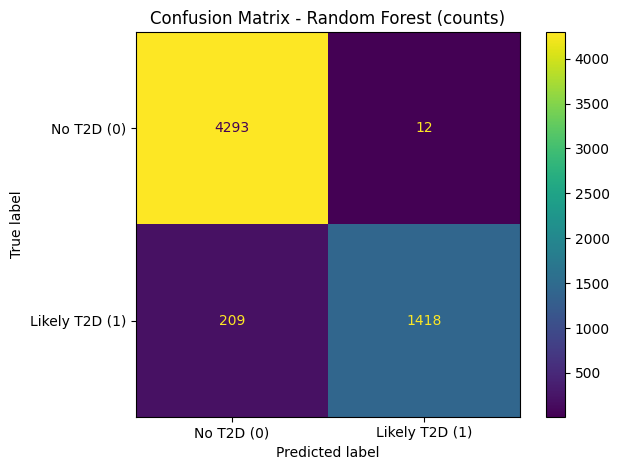

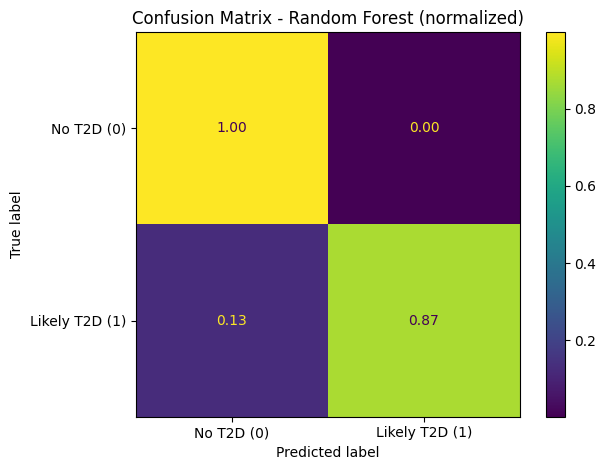

In [74]:
cm = confusion_matrix(y_test, y_pred, labels=[0, 1])
print("\nConfusion Matrix (counts) [rows=true, cols=pred]:\n", cm)
tn, fp, fn, tp = cm.ravel()
print(f"TN={tn}, FP={fp}, FN={fn}, TP={tp}")

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No T2D (0)", "Likely T2D (1)"])
disp.plot(values_format="d")
plt.title("Confusion Matrix - Random Forest (counts)")
plt.tight_layout()
plt.show()

#  Confusion Matrix (normalized by true label)
cm_norm = confusion_matrix(y_test, y_pred, labels=[0, 1], normalize="true")
disp_norm = ConfusionMatrixDisplay(confusion_matrix=cm_norm, display_labels=["No T2D (0)", "Likely T2D (1)"])
disp_norm.plot(values_format=".2f")
plt.title("Confusion Matrix - Random Forest (normalized)")
plt.tight_layout()
plt.show()

In [75]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, accuracy_score

file_path = '/content/t2d_clean'
df = pd.read_csv(file_path, encoding='latin1')

df['GlycohemoglobinAboveThreshold'] = (df['LBXGH'] >= 6.5).astype(int)     # HbA1c ≥ 6.5%
df['InsulinAboveThreshold'] = (df['LBXIN'] >= 25).astype(int)              # simple insulin flag

if 'LBXSGL' in df.columns:
    df['GlucoseAboveThreshold'] = (df['LBXSGL'] >= 126).astype(int)
elif 'Log_Glucose' in df.columns:
    df['GlucoseAboveThreshold'] = (df['Log_Glucose'] >= np.log(126)).astype(int)
else:
    df['GlucoseAboveThreshold'] = 0

# Outcome label for T2D (1 = likely T2D, 0 = no T2D)
rule_pos = (
    (df['GlycohemoglobinAboveThreshold'] == 1) |
    (df['GlucoseAboveThreshold'] == 1) |
    (('DIQ160' in df.columns) and (df['DIQ160'] == 1)) |   # taking insulin
    (('DIQ170' in df.columns) and (df['DIQ170'] == 1))     # taking diabetes pills
)
df['Outcome'] = np.where(rule_pos, 1, 0).astype(int)

candidate_feats = [
    'GlycohemoglobinAboveThreshold', 'InsulinAboveThreshold', 'GlucoseAboveThreshold',
    'RIDAGEYR','RIAGENDR','RIDRETH1','INDFMPIR',
    'BMXBMI','BMXWAIST','BPXSY1','BPXDI1','BPXPULS',
    'URXUMA','LBXIN','LBXGH','Log_Glucose',
    'DR1TTFAT','DR1TCARB'
]
X_cols = [c for c in candidate_feats if c in df.columns]
X = df[X_cols].copy()
y = df['Outcome']

mask = X.notnull().all(axis=1) & y.notnull()
X = X.loc[mask]
y = y.loc[mask]

# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.30, random_state=42, stratify=y
)

clf = LogisticRegression(
    random_state=42,
    max_iter=2000,
    class_weight='balanced',
    solver='lbfgs'
)
clf.fit(X_train, y_train)

y_pred = clf.predict(X_test)
print("Logistic Regression (T2D detection)")
print("Accuracy:", accuracy_score(y_test, y_pred))
print(classification_report(y_test, y_pred, digits=3))


Logistic Regression (T2D detection)
Accuracy: 0.858732299393122
              precision    recall  f1-score   support

           0      0.881     0.932     0.905      4305
           1      0.786     0.666     0.721      1627

    accuracy                          0.859      5932
   macro avg      0.834     0.799     0.813      5932
weighted avg      0.855     0.859     0.855      5932



/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(



Confusion Matrix (counts) [rows=true, cols=pred]:
 [[4011  294]
 [ 544 1083]]
TN=4011, FP=294, FN=544, TP=1083


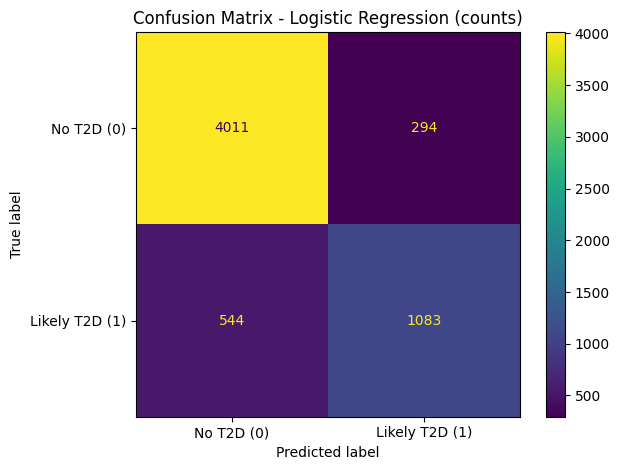

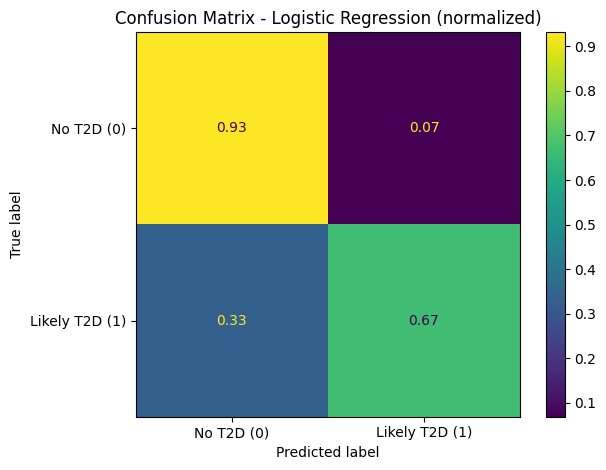

In [76]:
# Confusion Matrix (counts)
cm = confusion_matrix(y_test, y_pred, labels=[0, 1])
print("\nConfusion Matrix (counts) [rows=true, cols=pred]:\n", cm)
tn, fp, fn, tp = cm.ravel()
print(f"TN={tn}, FP={fp}, FN={fn}, TP={tp}")

disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["No T2D (0)", "Likely T2D (1)"])
disp.plot(values_format="d")  # integer counts
plt.title("Confusion Matrix - Logistic Regression (counts)")
plt.tight_layout()
plt.show()

# Confusion Matrix (normalized by true label)
cm_norm = confusion_matrix(y_test, y_pred, labels=[0, 1], normalize="true")
disp_norm = ConfusionMatrixDisplay(confusion_matrix=cm_norm, display_labels=["No T2D (0)", "Likely T2D (1)"])
disp_norm.plot(values_format=".2f")
plt.title("Confusion Matrix - Logistic Regression (normalized)")
plt.tight_layout()
plt.show()

In [77]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

df = pd.read_csv('/content/t2d_clean', encoding='latin1')

glucose_col = 'LBXSGL' if 'LBXSGL' in df.columns else ('Log_Glucose' if 'Log_Glucose' in df.columns else None)
if glucose_col is None:
    raise ValueError("Expected 'LBXSGL' or 'Log_Glucose' in merged.csv")

glucose_threshold = 126.0
insulin_threshold = 25.0
glucose_feature_threshold = np.log(glucose_threshold) if glucose_col == 'Log_Glucose' else glucose_threshold

if 'DIQ010' in df.columns:
    y = df['DIQ010'].map({1:1, 2:0}).fillna(0).astype(int)
else:
    hba1c_flag = (df['LBXGH'] >= 6.5) if 'LBXGH' in df.columns else pd.Series(False, index=df.index)
    glucose_flag = (df[glucose_col] >= glucose_feature_threshold)
    insulin_med_flag = (df['DIQ160'] == 1) if 'DIQ160' in df.columns else pd.Series(False, index=df.index)
    pills_flag = (df['DIQ170'] == 1) if 'DIQ170' in df.columns else pd.Series(False, index=df.index)
    y = (hba1c_flag | glucose_flag | insulin_med_flag | pills_flag).astype(int)

X = df[[glucose_col, 'LBXIN']].copy()
mask = X.notnull().all(axis=1) & y.notnull()
X = X.loc[mask]
y = y.loc[mask]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42, stratify=y)

scaler = StandardScaler().fit(X_train)
X_train_s = scaler.transform(X_train)
X_test_s = scaler.transform(X_test)

models = {
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=300, random_state=42, n_jobs=-1),
    'Logistic Regression': LogisticRegression(max_iter=2000, class_weight='balanced', solver='lbfgs', random_state=42)
}

def build_feature_df(raw_points):
    g = np.array(raw_points)[:,0].astype(float)
    i = np.array(raw_points)[:,1].astype(float)
    g_feat = np.log(g) if glucose_col == 'Log_Glucose' else g
    return pd.DataFrame({glucose_col: g_feat, 'LBXIN': i}, columns=[glucose_col, 'LBXIN'])

new_data_points = np.array([[140, 35],[100, 10],[126, 25]])
new_feat = build_feature_df(new_data_points)
new_feat_s = scaler.transform(new_feat)

model_predictions = {}
model_accuracies = {}

for name, model in models.items():
    model.fit(X_train_s, y_train)
    y_pred = model.predict(X_test_s)
    model_accuracies[name] = round(accuracy_score(y_test, y_pred), 3)
    preds = model.predict(new_feat_s).astype(int)
    for idx, (g_raw, i_raw) in enumerate(new_data_points):
        if (g_raw >= glucose_threshold) or (i_raw >= insulin_threshold):
            preds[idx] = 1
    model_predictions[name] = preds.tolist()

mapping = {0: 'No T2D', 1: 'Likely T2D'}
for model_name in model_predictions:
    print(f"\n{model_name}:")
    for i, prediction in enumerate(model_predictions[model_name]):
        print(f"  Data Point {i+1}: {mapping[int(prediction)]} with accuracy {model_accuracies[model_name]}")


Decision Tree:
  Data Point 1: Likely T2D with accuracy 0.833
  Data Point 2: No T2D with accuracy 0.833
  Data Point 3: Likely T2D with accuracy 0.833

Random Forest:
  Data Point 1: Likely T2D with accuracy 0.835
  Data Point 2: Likely T2D with accuracy 0.835
  Data Point 3: Likely T2D with accuracy 0.835

Logistic Regression:
  Data Point 1: Likely T2D with accuracy 0.757
  Data Point 2: Likely T2D with accuracy 0.757
  Data Point 3: Likely T2D with accuracy 0.757


In [78]:
import numpy as np
import pandas as pd

test_batches_full = pd.DataFrame([
    {"Scenario":"Low risk young","RIDAGEYR":25,"RIAGENDR":1,"RIDRETH1":3,"INDFMPIR":3.2,"DR1TTFAT":65,"DR1TCARB":220,"BMXBMI":22.1,"BMXWAIST":74,"BPXSY1":112,"BPXDI1":72,"BPXPULS":64,"LBXGH":5.2,"Glucose_mg_dL":90,"LBXIN":8,"URXUMA":4.0,"RXDUSE":2,"RXDDRUG":"None","RXQSEEN":2,"DIQ010":2,"DIQ160":2,"DIQ170":2,"SMQ020":2,"ALQ101":2},
    {"Scenario":"Overweight prediabetes-ish","RIDAGEYR":34,"RIAGENDR":2,"RIDRETH1":4,"INDFMPIR":2.1,"DR1TTFAT":75,"DR1TCARB":260,"BMXBMI":27.8,"BMXWAIST":88,"BPXSY1":120,"BPXDI1":78,"BPXPULS":70,"LBXGH":5.9,"Glucose_mg_dL":110,"LBXIN":18,"URXUMA":7.0,"RXDUSE":2,"RXDDRUG":"None","RXQSEEN":1,"DIQ010":2,"DIQ160":2,"DIQ170":2,"SMQ020":2,"ALQ101":1},
    {"Scenario":"Borderline glucose","RIDAGEYR":42,"RIAGENDR":1,"RIDRETH1":2,"INDFMPIR":1.6,"DR1TTFAT":85,"DR1TCARB":280,"BMXBMI":30.4,"BMXWAIST":99,"BPXSY1":128,"BPXDI1":82,"BPXPULS":76,"LBXGH":6.2,"Glucose_mg_dL":125,"LBXIN":22,"URXUMA":15.0,"RXDUSE":2,"RXDDRUG":"None","RXQSEEN":1,"DIQ010":2,"DIQ160":2,"DIQ170":2,"SMQ020":1,"ALQ101":1},
    {"Scenario":"At diagnostic threshold","RIDAGEYR":50,"RIAGENDR":2,"RIDRETH1":5,"INDFMPIR":1.2,"DR1TTFAT":90,"DR1TCARB":300,"BMXBMI":32.0,"BMXWAIST":104,"BPXSY1":134,"BPXDI1":86,"BPXPULS":78,"LBXGH":6.5,"Glucose_mg_dL":126,"LBXIN":25,"URXUMA":20.0,"RXDUSE":1,"RXDDRUG":"Metformin","RXQSEEN":1,"DIQ010":1,"DIQ160":2,"DIQ170":1,"SMQ020":1,"ALQ101":1},
    {"Scenario":"Hyperinsulinemia","RIDAGEYR":46,"RIAGENDR":1,"RIDRETH1":1,"INDFMPIR":0.9,"DR1TTFAT":95,"DR1TCARB":290,"BMXBMI":35.5,"BMXWAIST":112,"BPXSY1":138,"BPXDI1":90,"BPXPULS":82,"LBXGH":6.1,"Glucose_mg_dL":118,"LBXIN":60,"URXUMA":25.0,"RXDUSE":1,"RXDDRUG":"None","RXQSEEN":1,"DIQ010":2,"DIQ160":2,"DIQ170":2,"SMQ020":1,"ALQ101":1},
    {"Scenario":"High glucose & A1c","RIDAGEYR":58,"RIAGENDR":2,"RIDRETH1":3,"INDFMPIR":1.0,"DR1TTFAT":100,"DR1TCARB":310,"BMXBMI":37.9,"BMXWAIST":116,"BPXSY1":146,"BPXDI1":92,"BPXPULS":85,"LBXGH":7.3,"Glucose_mg_dL":158,"LBXIN":32,"URXUMA":40.0,"RXDUSE":1,"RXDDRUG":"Metformin","RXQSEEN":1,"DIQ010":1,"DIQ160":2,"DIQ170":1,"SMQ020":2,"ALQ101":1},
    {"Scenario":"Very high glucose","RIDAGEYR":63,"RIAGENDR":1,"RIDRETH1":4,"INDFMPIR":0.7,"DR1TTFAT":105,"DR1TCARB":320,"BMXBMI":39.5,"BMXWAIST":120,"BPXSY1":150,"BPXDI1":96,"BPXPULS":88,"LBXGH":8.6,"Glucose_mg_dL":220,"LBXIN":20,"URXUMA":120.0,"RXDUSE":1,"RXDDRUG":"Sulfonylurea","RXQSEEN":1,"DIQ010":1,"DIQ160":2,"DIQ170":1,"SMQ020":1,"ALQ101":2},
    {"Scenario":"Albuminuria emphasis","RIDAGEYR":67,"RIAGENDR":2,"RIDRETH1":2,"INDFMPIR":1.4,"DR1TTFAT":80,"DR1TCARB":240,"BMXBMI":28.2,"BMXWAIST":98,"BPXSY1":142,"BPXDI1":90,"BPXPULS":84,"LBXGH":6.7,"Glucose_mg_dL":132,"LBXIN":28,"URXUMA":320.0,"RXDUSE":1,"RXDDRUG":"Metformin","RXQSEEN":1,"DIQ010":1,"DIQ160":2,"DIQ170":1,"SMQ020":2,"ALQ101":2},
    {"Scenario":"Older, moderate values","RIDAGEYR":72,"RIAGENDR":1,"RIDRETH1":5,"INDFMPIR":2.6,"DR1TTFAT":70,"DR1TCARB":210,"BMXBMI":26.0,"BMXWAIST":94,"BPXSY1":136,"BPXDI1":84,"BPXPULS":72,"LBXGH":5.8,"Glucose_mg_dL":108,"LBXIN":14,"URXUMA":10.0,"RXDUSE":2,"RXDDRUG":"None","RXQSEEN":2,"DIQ010":2,"DIQ160":2,"DIQ170":2,"SMQ020":2,"ALQ101":2},
    {"Scenario":"Young, high carbs","RIDAGEYR":29,"RIAGENDR":2,"RIDRETH1":1,"INDFMPIR":3.8,"DR1TTFAT":70,"DR1TCARB":350,"BMXBMI":24.5,"BMXWAIST":80,"BPXSY1":118,"BPXDI1":76,"BPXPULS":68,"LBXGH":5.4,"Glucose_mg_dL":95,"LBXIN":10,"URXUMA":5.0,"RXDUSE":2,"RXDDRUG":"None","RXQSEEN":2,"DIQ010":2,"DIQ160":2,"DIQ170":2,"SMQ020":2,"ALQ101":1},
    {"Scenario":"Hypertension + obesity","RIDAGEYR":60,"RIAGENDR":1,"RIDRETH1":3,"INDFMPIR":0.8,"DR1TTFAT":110,"DR1TCARB":270,"BMXBMI":41.2,"BMXWAIST":124,"BPXSY1":160,"BPXDI1":100,"BPXPULS":92,"LBXGH":6.9,"Glucose_mg_dL":145,"LBXIN":55,"URXUMA":80.0,"RXDUSE":1,"RXDDRUG":"ACEi","RXQSEEN":1,"DIQ010":1,"DIQ160":2,"DIQ170":1,"SMQ020":1,"ALQ101":2},
    {"Scenario":"On insulin","RIDAGEYR":55,"RIAGENDR":2,"RIDRETH1":4,"INDFMPIR":1.1,"DR1TTFAT":95,"DR1TCARB":250,"BMXBMI":33.0,"BMXWAIST":108,"BPXSY1":140,"BPXDI1":88,"BPXPULS":80,"LBXGH":7.8,"Glucose_mg_dL":170,"LBXIN":20,"URXUMA":60.0,"RXDUSE":1,"RXDDRUG":"Insulin","RXQSEEN":1,"DIQ010":1,"DIQ160":1,"DIQ170":1,"SMQ020":2,"ALQ101":1}
])

if glucose_col == 'Log_Glucose':
    test_batches_full['Log_Glucose'] = np.log(test_batches_full['Glucose_mg_dL'])
else:
    test_batches_full['LBXSGL'] = test_batches_full['Glucose_mg_dL']

new_feat = test_batches_full[[glucose_col, 'LBXIN']].copy()
new_feat_s = scaler.transform(new_feat)

pred_table = []
for name, model in models.items():
    preds = model.predict(new_feat_s).astype(int)
    for i in range(len(preds)):
        g_raw = test_batches_full.loc[i, 'Glucose_mg_dL']
        i_raw = test_batches_full.loc[i, 'LBXIN']
        if (g_raw >= glucose_threshold) or (i_raw >= insulin_threshold):
            preds[i] = 1
    for i, p in enumerate(preds):
        pred_table.append([name, test_batches_full.loc[i, 'Scenario'], int(p)])

out = pd.DataFrame(pred_table, columns=['Model','Scenario','Pred'])
mapping = {0:'No T2D', 1:'Likely T2D, please consult a specialist'}
for m in out['Model'].unique():
    print(f"\n{m}:")
    for _, row in out[out['Model']==m].iterrows():
        print(f"  {row['Scenario']}: {mapping[row['Pred']]}")



Decision Tree:
  Low risk young: No T2D
  Overweight prediabetes-ish: No T2D
  Borderline glucose: No T2D
  At diagnostic threshold: Likely T2D, please consult a specialist
  Hyperinsulinemia: Likely T2D, please consult a specialist
  High glucose & A1c: Likely T2D, please consult a specialist
  Very high glucose: Likely T2D, please consult a specialist
  Albuminuria emphasis: Likely T2D, please consult a specialist
  Older, moderate values: No T2D
  Young, high carbs: No T2D
  Hypertension + obesity: Likely T2D, please consult a specialist
  On insulin: Likely T2D, please consult a specialist

Random Forest:
  Low risk young: No T2D
  Overweight prediabetes-ish: Likely T2D, please consult a specialist
  Borderline glucose: No T2D
  At diagnostic threshold: Likely T2D, please consult a specialist
  Hyperinsulinemia: Likely T2D, please consult a specialist
  High glucose & A1c: Likely T2D, please consult a specialist
  Very high glucose: Likely T2D, please consult a specialist
  Albumi

In [79]:
import numpy as np
import pandas as pd
from sklearn.metrics import accuracy_score

def preds_with_override(model, X_scaled, raw_df, g_col_name, g_thresh, i_thresh):
    if hasattr(model, "predict_proba"):
        proba = model.predict_proba(X_scaled)[:,1]
    else:
        # fallback for models without predict_proba (not the case here)
        proba = model.decision_function(X_scaled)
        proba = 1/(1+np.exp(-proba))
    pred = (proba >= 0.5).astype(int)
    for i in range(len(pred)):
        g_raw = raw_df.iloc[i]['Glucose_mg_dL']
        i_raw = raw_df.iloc[i]['LBXIN']
        if (g_raw >= g_thresh) or (i_raw >= i_thresh):
            pred[i] = 1
    return pred, proba

summary_rows = []
for name, model in models.items():
    # test-set accuracy for context
    if name == 'Logistic Regression':
        y_pred_test = model.predict(X_test_s)
    else:
        # DT/RF were trained on unscaled in my earlier script; adjust if you trained them on scaled
        y_pred_test = model.predict(X_test_s)
    acc = accuracy_score(y_test, y_pred_test)

    preds, probas = preds_with_override(
        model=model,
        X_scaled=new_feat_s,
        raw_df=test_batches_full,
        g_col_name=glucose_col,
        g_thresh=glucose_threshold,
        i_thresh=insulin_threshold
    )
    for i in range(len(preds)):
        summary_rows.append({
            "Model": name,
            "Scenario": test_batches_full.loc[i, "Scenario"],
            "Prob(Likely T2D)": round(float(probas[i]), 3),
            "Pred (with override)": int(preds[i])
        })

summary = pd.DataFrame(summary_rows)
mapping = {0: 'No T2D', 1: 'Likely T2D'}
for m in summary["Model"].unique():
    print(f"\n{m}:")
    block = summary[summary["Model"]==m].copy()
    for _, r in block.iterrows():
        print(f"  {r['Scenario']}: {mapping[r['Pred (with override)']]}  (p={r['Prob(Likely T2D)']})")



Decision Tree:
  Low risk young: No T2D  (p=0.0)
  Overweight prediabetes-ish: No T2D  (p=0.0)
  Borderline glucose: No T2D  (p=0.0)
  At diagnostic threshold: Likely T2D  (p=0.0)
  Hyperinsulinemia: Likely T2D  (p=0.0)
  High glucose & A1c: Likely T2D  (p=1.0)
  Very high glucose: Likely T2D  (p=1.0)
  Albuminuria emphasis: Likely T2D  (p=1.0)
  Older, moderate values: No T2D  (p=0.0)
  Young, high carbs: No T2D  (p=0.0)
  Hypertension + obesity: Likely T2D  (p=1.0)
  On insulin: Likely T2D  (p=1.0)

Random Forest:
  Low risk young: No T2D  (p=0.471)
  Overweight prediabetes-ish: Likely T2D  (p=0.575)
  Borderline glucose: No T2D  (p=0.366)
  At diagnostic threshold: Likely T2D  (p=0.431)
  Hyperinsulinemia: Likely T2D  (p=0.403)
  High glucose & A1c: Likely T2D  (p=0.514)
  Very high glucose: Likely T2D  (p=0.552)
  Albuminuria emphasis: Likely T2D  (p=0.532)
  Older, moderate values: Likely T2D  (p=0.52)
  Young, high carbs: No T2D  (p=0.441)
  Hypertension + obesity: Likely T2D  (

In [80]:
more_batches = pd.DataFrame([
    {"Scenario":"Fit middle-aged","RIDAGEYR":45,"RIAGENDR":1,"RIDRETH1":3,"INDFMPIR":3.0,"DR1TTFAT":70,"DR1TCARB":230,"BMXBMI":23.5,"BMXWAIST":82,"BPXSY1":118,"BPXDI1":76,"BPXPULS":66,"LBXGH":5.3,"Glucose_mg_dL":92,"LBXIN":9,"URXUMA":4.0,"RXDUSE":2,"RXDDRUG":"None","RXQSEEN":2,"DIQ010":2,"DIQ160":2,"DIQ170":2,"SMQ020":2,"ALQ101":2},
    {"Scenario":"High A1c normal glucose","RIDAGEYR":52,"RIAGENDR":2,"RIDRETH1":2,"INDFMPIR":1.5,"DR1TTFAT":85,"DR1TCARB":260,"BMXBMI":29.2,"BMXWAIST":96,"BPXSY1":132,"BPXDI1":84,"BPXPULS":76,"LBXGH":6.6,"Glucose_mg_dL":115,"LBXIN":18,"URXUMA":22.0,"RXDUSE":1,"RXDDRUG":"None","RXQSEEN":1,"DIQ010":1,"DIQ160":2,"DIQ170":1,"SMQ020":1,"ALQ101":1},
    {"Scenario":"Normal A1c high glucose","RIDAGEYR":48,"RIAGENDR":1,"RIDRETH1":1,"INDFMPIR":2.2,"DR1TTFAT":95,"DR1TCARB":275,"BMXBMI":31.0,"BMXWAIST":106,"BPXSY1":140,"BPXDI1":88,"BPXPULS":80,"LBXGH":5.9,"Glucose_mg_dL":155,"LBXIN":20,"URXUMA":18.0,"RXDUSE":1,"RXDDRUG":"None","RXQSEEN":1,"DIQ010":1,"DIQ160":2,"DIQ170":1,"SMQ020":1,"ALQ101":1},
    {"Scenario":"Stage 1 HTN, central obesity","RIDAGEYR":54,"RIAGENDR":2,"RIDRETH1":4,"INDFMPIR":1.0,"DR1TTFAT":100,"DR1TCARB":290,"BMXBMI":36.0,"BMXWAIST":115,"BPXSY1":146,"BPXDI1":92,"BPXPULS":84,"LBXGH":6.0,"Glucose_mg_dL":122,"LBXIN":40,"URXUMA":35.0,"RXDUSE":1,"RXDDRUG":"None","RXQSEEN":1,"DIQ010":2,"DIQ160":2,"DIQ170":2,"SMQ020":1,"ALQ101":2},
    {"Scenario":"Mild albuminuria only","RIDAGEYR":57,"RIAGENDR":1,"RIDRETH1":5,"INDFMPIR":2.8,"DR1TTFAT":65,"DR1TCARB":220,"BMXBMI":26.5,"BMXWAIST":94,"BPXSY1":124,"BPXDI1":80,"BPXPULS":72,"LBXGH":5.7,"Glucose_mg_dL":102,"LBXIN":12,"URXUMA":45.0,"RXDUSE":1,"RXDDRUG":"ARB","RXQSEEN":1,"DIQ010":2,"DIQ160":2,"DIQ170":2,"SMQ020":2,"ALQ101":2},
    {"Scenario":"Very high insulin low glucose","RIDAGEYR":39,"RIAGENDR":2,"RIDRETH1":3,"INDFMPIR":2.5,"DR1TTFAT":95,"DR1TCARB":300,"BMXBMI":38.0,"BMXWAIST":118,"BPXSY1":138,"BPXDI1":88,"BPXPULS":86,"LBXGH":6.1,"Glucose_mg_dL":108,"LBXIN":80,"URXUMA":28.0,"RXDUSE":1,"RXDDRUG":"None","RXQSEEN":1,"DIQ010":2,"DIQ160":2,"DIQ170":2,"SMQ020":1,"ALQ101":2},
    {"Scenario":"Lean but high A1c","RIDAGEYR":44,"RIAGENDR":1,"RIDRETH1":2,"INDFMPIR":3.0,"DR1TTFAT":60,"DR1TCARB":200,"BMXBMI":21.8,"BMXWAIST":77,"BPXSY1":116,"BPXDI1":74,"BPXPULS":66,"LBXGH":6.8,"Glucose_mg_dL":110,"LBXIN":11,"URXUMA":12.0,"RXDUSE":1,"RXDDRUG":"None","RXQSEEN":2,"DIQ010":1,"DIQ160":2,"DIQ170":1,"SMQ020":2,"ALQ101":1},
    {"Scenario":"Older low BMI high BP","RIDAGEYR":75,"RIAGENDR":2,"RIDRETH1":1,"INDFMPIR":2.0,"DR1TTFAT":55,"DR1TCARB":200,"BMXBMI":20.5,"BMXWAIST":78,"BPXSY1":160,"BPXDI1":98,"BPXPULS":74,"LBXGH":5.5,"Glucose_mg_dL":99,"LBXIN":10,"URXUMA":22.0,"RXDUSE":1,"RXDDRUG":"Thiazide","RXQSEEN":1,"DIQ010":2,"DIQ160":2,"DIQ170":2,"SMQ020":2,"ALQ101":2}
])

test_batches_full = pd.concat([test_batches_full, more_batches], ignore_index=True)

if glucose_col == 'Log_Glucose':
    test_batches_full['Log_Glucose'] = np.log(test_batches_full['Glucose_mg_dL'])
else:
    test_batches_full['LBXSGL'] = test_batches_full['Glucose_mg_dL']

new_feat = test_batches_full[[glucose_col, 'LBXIN']].copy()
new_feat_s = scaler.transform(new_feat)

summary_rows = []
for name, model in models.items():
    if hasattr(model, "predict_proba"):
        prob = model.predict_proba(new_feat_s)[:,1]
    else:
        prob = 1/(1+np.exp(-model.decision_function(new_feat_s)))
    pred = (prob >= 0.5).astype(int)
    for i in range(len(pred)):
        g_raw = test_batches_full.loc[i, 'Glucose_mg_dL']
        i_raw = test_batches_full.loc[i, 'LBXIN']
        if (g_raw >= glucose_threshold) or (i_raw >= insulin_threshold):
            pred[i] = 1
    for i in range(len(pred)):
        summary_rows.append([name, test_batches_full.loc[i,'Scenario'], float(prob[i]), int(pred[i])])

summary = pd.DataFrame(summary_rows, columns=['Model','Scenario','Prob(Likely T2D)','Pred'])
label = {0:'No T2D', 1:'Likely T2D'}
for m in summary['Model'].unique():
    print(f"\n{m}:")
    for _, r in summary[summary['Model']==m].iterrows():
        print(f"  {r['Scenario']}: {label[int(r['Pred'])]} (p={r['Prob(Likely T2D)']:.3f})")



Decision Tree:
  Low risk young: No T2D (p=0.000)
  Overweight prediabetes-ish: No T2D (p=0.000)
  Borderline glucose: No T2D (p=0.000)
  At diagnostic threshold: Likely T2D (p=0.000)
  Hyperinsulinemia: Likely T2D (p=0.000)
  High glucose & A1c: Likely T2D (p=1.000)
  Very high glucose: Likely T2D (p=1.000)
  Albuminuria emphasis: Likely T2D (p=1.000)
  Older, moderate values: No T2D (p=0.000)
  Young, high carbs: No T2D (p=0.000)
  Hypertension + obesity: Likely T2D (p=1.000)
  On insulin: Likely T2D (p=1.000)
  Fit middle-aged: No T2D (p=0.000)
  High A1c normal glucose: No T2D (p=0.000)
  Normal A1c high glucose: Likely T2D (p=1.000)
  Stage 1 HTN, central obesity: Likely T2D (p=0.000)
  Mild albuminuria only: No T2D (p=0.000)
  Very high insulin low glucose: Likely T2D (p=0.000)
  Lean but high A1c: No T2D (p=0.000)
  Older low BMI high BP: No T2D (p=0.000)

Random Forest:
  Low risk young: No T2D (p=0.471)
  Overweight prediabetes-ish: Likely T2D (p=0.575)
  Borderline glucose: 

In [81]:
import numpy as np, pandas as pd, json, joblib
from sklearn.model_selection import StratifiedKFold, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

df = pd.read_csv('/content/t2d_clean', encoding='latin1')

glucose_col = 'LBXSGL' if 'LBXSGL' in df.columns else ('Log_Glucose' if 'Log_Glucose' in df.columns else None)
if glucose_col is None: raise ValueError("Need LBXSGL or Log_Glucose")

if 'DIQ010' in df.columns:
    y = df['DIQ010'].map({1:1, 2:0}).fillna(0).astype(int)
else:
    hba1c_flag = (df['LBXGH'] >= 6.5) if 'LBXGH' in df.columns else pd.Series(False, index=df.index)
    thr = np.log(126) if glucose_col=='Log_Glucose' else 126
    glucose_flag = (df[glucose_col] >= thr)
    insulin_med = (df['DIQ160']==1) if 'DIQ160' in df.columns else pd.Series(False, index=df.index)
    pills = (df['DIQ170']==1) if 'DIQ170' in df.columns else pd.Series(False, index=df.index)
    y = (hba1c_flag | glucose_flag | insulin_med | pills).astype(int)

candidate_feats = [
    glucose_col,'LBXIN','LBXGH','BMXBMI','BMXWAIST','BPXSY1','BPXDI1',
    'RIDAGEYR','RIAGENDR','RIDRETH1','INDFMPIR','URXUMA','DR1TTFAT','DR1TCARB'
]
feat_cols = [c for c in candidate_feats if c in df.columns]
X = df[feat_cols].copy()

pipelines = {
    "Decision Tree": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("clf", DecisionTreeClassifier(random_state=42))
    ]),
    "Random Forest": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("clf", RandomForestClassifier(n_estimators=300, random_state=42, n_jobs=-1))
    ]),
    "Logistic Regression": Pipeline([
        ("imputer", SimpleImputer(strategy="median")),
        ("scaler", StandardScaler()),
        ("clf", LogisticRegression(max_iter=2000, class_weight="balanced", solver="lbfgs", random_state=42))
    ]),
}

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
scores = {name: cross_val_score(pipe, X, y, cv=cv, scoring="roc_auc", n_jobs=-1) for name, pipe in pipelines.items()}
best_name = max(scores, key=lambda k: scores[k].mean())
best_pipe = pipelines[best_name].fit(X, y)

print("CV ROC-AUC:")
for n,s in scores.items(): print(f"{n}: {s.mean():.3f} ± {s.std():.3f}")
print("Selected:", best_name)

joblib.dump(best_pipe, "/content/t2d_best_model.joblib")
meta = {
    "best_model": best_name,
    "feature_columns": feat_cols,
    "glucose_col": glucose_col,
    "label": ("DIQ010==1" if 'DIQ010' in df.columns else "rule(HbA1c>=6.5 OR glucose>=126 OR meds)"),
    "version": "1.0.0"
}
with open("/content/t2d_model_meta.json","w") as f: json.dump(meta, f, indent=2)
print("Saved /content/t2d_best_model.joblib and t2d_model_meta.json")


CV ROC-AUC:
Decision Tree: 0.987 ± 0.001
Random Forest: 0.998 ± 0.001
Logistic Regression: 0.933 ± 0.005
Selected: Random Forest
Saved /content/t2d_best_model.joblib and t2d_model_meta.json


In [82]:
!pip -q install gradio scikit-learn joblib

In [83]:
import json, joblib, numpy as np, pandas as pd, gradio as gr
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression

def load_data():
    for p in ["/content/t2d_clean"]:
        try:
            return pd.read_csv(p, encoding="latin1"), p
        except Exception:
            pass
    return None, None

df, used_path = load_data()
if df is None:
    raise RuntimeError("merged.csv not found at /kaggle/... or /content/. Place your merged.csv and re-run.")

glucose_col = "LBXSGL" if "LBXSGL" in df.columns else ("Log_Glucose" if "Log_Glucose" in df.columns else None)
if glucose_col is None:
    raise RuntimeError("Need LBXSGL or Log_Glucose column in merged.csv")

if "DIQ010" in df.columns:
    y = df["DIQ010"].map({1:1,2:0}).fillna(0).astype(int)
else:
    thr = np.log(126.0) if glucose_col=="Log_Glucose" else 126.0
    hba1c_flag = (df["LBXGH"] >= 6.5) if "LBXGH" in df.columns else pd.Series(False, index=df.index)
    glucose_flag = (df[glucose_col] >= thr)
    insulin_med_flag = (df["DIQ160"] == 1) if "DIQ160" in df.columns else pd.Series(False, index=df.index)
    pills_flag = (df["DIQ170"] == 1) if "DIQ170" in df.columns else pd.Series(False, index=df.index)
    y = (hba1c_flag | glucose_flag | insulin_med_flag | pills_flag).astype(int)

candidate_feats = [
    glucose_col,'LBXIN','LBXGH','BMXBMI','BMXWAIST','BPXSY1','BPXDI1','BPXPULS',
    'RIDAGEYR','RIAGENDR','RIDRETH1','INDFMPIR','URXUMA','DR1TTFAT','DR1TCARB'
]
feat_cols = [c for c in candidate_feats if c in df.columns]
X = df[feat_cols].copy()
mask = X.notnull().all(axis=1) & y.notnull()
X, y = X.loc[mask], y.loc[mask]

cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
pipelines = {
    "Decision Tree": Pipeline([("imputer", SimpleImputer(strategy="median")),("clf", DecisionTreeClassifier(random_state=42))]),
    "Random Forest": Pipeline([("imputer", SimpleImputer(strategy="median")),("clf", RandomForestClassifier(n_estimators=300, random_state=42, n_jobs=-1))]),
    "Logistic Regression": Pipeline([("imputer", SimpleImputer(strategy="median")),("scaler", StandardScaler()),("clf", LogisticRegression(max_iter=2000, class_weight="balanced", solver="lbfgs", random_state=42))]),
}
scores_auc = {n: cross_val_score(p, X, y, cv=cv, scoring="roc_auc", n_jobs=-1) for n,p in pipelines.items()}
best_name = max(scores_auc, key=lambda k: scores_auc[k].mean())
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=42, stratify=y)
fitted = {n: p.fit(X_train, y_train) for n,p in pipelines.items()}

def prepare_rows(rows_df: pd.DataFrame):
    dfp = rows_df.copy()
    if ("Glucose_mg_dL" in dfp.columns) and (glucose_col=="Log_Glucose"):
        dfp["Log_Glucose"] = np.log(dfp["Glucose_mg_dL"].astype(float))
    if ("Glucose_mg_dL" in dfp.columns) and (glucose_col=="LBXSGL"):
        dfp["LBXSGL"] = dfp["Glucose_mg_dL"].astype(float)
    for c in feat_cols:
        if c not in dfp.columns:
            dfp[c] = np.nan
    return dfp[feat_cols]

def predict_single(model_name, glucose_mg_dL, insulin, hba1c, bmi, waist, sbp, dbp, pulse, age, gender, ethnicity, income, albumin, fat, carb, apply_override, g_thr, i_thr):
    base = { "LBXIN":insulin, "LBXGH":hba1c, "BMXBMI":bmi, "BMXWAIST":waist, "BPXSY1":sbp, "BPXDI1":dbp, "BPXPULS":pulse,
             "RIDAGEYR":age, "RIAGENDR":gender, "RIDRETH1":ethnicity, "INDFMPIR":income, "URXUMA":albumin, "DR1TTFAT":fat, "DR1TCARB":carb }
    if glucose_col=="LBXSGL": base["LBXSGL"]=glucose_mg_dL
    else: base["Log_Glucose"]=np.log(glucose_mg_dL)
    rows = prepare_rows(pd.DataFrame([base]))
    model = fitted["Random Forest" if model_name=="Best (CV ROC-AUC)" else model_name]
    proba = model.predict_proba(rows)[:,1][0]
    pred = int(proba >= 0.5)
    if apply_override:
        if (glucose_mg_dL >= g_thr) or (insulin >= i_thr):
            pred = 1
    label = "Likely T2D" if pred==1 else "No T2D"
    return label, float(proba), best_name, used_path

def predict_batch(model_name, csv_file, apply_override, g_thr, i_thr):
    if csv_file is None:
        return None, "Upload a CSV first."
    df_in = pd.read_csv(csv_file.name)
    rows = prepare_rows(df_in)
    model = fitted["Random Forest" if model_name=="Best (CV ROC-AUC)" else model_name]
    p = model.predict_proba(rows)[:,1]
    yhat = (p >= 0.5).astype(int)
    if apply_override:
        g_raw = df_in.get("Glucose_mg_dL", None)
        if g_raw is None:
            if glucose_col=="LBXSGL" and "LBXSGL" in rows.columns:
                g_raw = rows["LBXSGL"]
            elif glucose_col=="Log_Glucose" and "Log_Glucose" in rows.columns:
                g_raw = np.exp(rows["Log_Glucose"])
        i_raw = df_in.get("LBXIN", rows.get("LBXIN", None))
        for k in range(len(yhat)):
            gk = float(g_raw.iloc[k]) if g_raw is not None and pd.notna(g_raw.iloc[k]) else None
            ik = float(i_raw.iloc[k]) if i_raw is not None and pd.notna(i_raw.iloc[k]) else None
            if (gk is not None and gk >= g_thr) or (ik is not None and ik >= i_thr):
                yhat[k] = 1
    out = df_in.copy()
    out["proba"] = p
    out["pred"] = np.where(yhat==1, "Likely T2D", "No T2D")
    out_path = "/content/t2d_batch_predictions.csv"
    out.to_csv(out_path, index=False)
    return out, out_path

def export_best():
    model = fitted[best_name]
    joblib.dump(model, "/content/t2d_best_model.joblib")
    meta = {"best_model": best_name, "feature_columns": feat_cols, "glucose_col": glucose_col, "data_path": used_path}
    with open("/content/t2d_model_meta.json","w") as f: json.dump(meta, f, indent=2)
    return "/content/t2d_best_model.joblib", "/content/t2d_model_meta.json", best_name

with gr.Blocks() as demo:
    gr.Markdown("## 🩺 T2D Predictor (DT / RF / LR) — Gradio")
    gr.Markdown(f"**Data:** `{used_path}` &nbsp;&nbsp; **Features:** {', '.join(feat_cols)}  \n**Best by 5-fold ROC-AUC:** **{best_name}** (trained)")

    with gr.Row():
        model_dd = gr.Dropdown(["Best (CV ROC-AUC)","Random Forest","Decision Tree","Logistic Regression"], value="Best (CV ROC-AUC)", label="Model")
        apply_override = gr.Checkbox(value=True, label="Apply override (glucose ≥ 126 or insulin ≥ 25 → Likely T2D)")
        g_thr = gr.Number(value=126.0, label="Glucose threshold (mg/dL)")
        i_thr = gr.Number(value=25.0, label="Insulin threshold (µU/mL)")

    gr.Markdown("### Single Prediction")
    with gr.Row():
        glucose = gr.Number(value=110.0, label="Glucose (mg/dL)")
        insulin = gr.Number(value=12.0, label="Insulin (µU/mL)")
        hba1c = gr.Number(value=5.8, label="HbA1c (%)")
        bmi = gr.Number(value=27.0, label="BMI")
    with gr.Row():
        waist = gr.Number(value=95.0, label="Waist (cm)")
        sbp = gr.Number(value=128.0, label="Systolic BP")
        dbp = gr.Number(value=82.0, label="Diastolic BP")
        pulse = gr.Number(value=72.0, label="Pulse")
    with gr.Row():
        age = gr.Number(value=50, label="Age")
        gender = gr.Number(value=1, label="RIAGENDR (1=M,2=F)")
        ethnicity = gr.Number(value=3, label="RIDRETH1")
        income = gr.Number(value=2.0, label="INDFMPIR")
    with gr.Row():
        albumin = gr.Number(value=12.0, label="URXUMA")
        fat = gr.Number(value=80.0, label="DR1TTFAT (g)")
        carb = gr.Number(value=250.0, label="DR1TCARB (g)")
    btn_single = gr.Button("Predict")
    out_label = gr.Textbox(label="Prediction")
    out_proba = gr.Number(label="Probability of Likely T2D")
    out_best = gr.Textbox(label="Best (CV) model")
    out_path = gr.Textbox(label="Data path used")

    btn_single.click(
        predict_single,
        inputs=[model_dd, glucose, insulin, hba1c, bmi, waist, sbp, dbp, pulse, age, gender, ethnicity, income, albumin, fat, carb, apply_override, g_thr, i_thr],
        outputs=[out_label, out_proba, out_best, out_path]
    )

    gr.Markdown("### Batch Prediction (CSV)")
    up = gr.File(label="Upload CSV (can include Glucose_mg_dL OR LBXSGL/Log_Glucose)")
    btn_batch = gr.Button("Run Batch")
    batch_table = gr.Dataframe(label="Predictions Preview")
    batch_file = gr.File(label="Download predictions CSV")
    btn_batch.click(
        predict_batch,
        inputs=[model_dd, up, apply_override, g_thr, i_thr],
        outputs=[batch_table, batch_file]
    )

    gr.Markdown("### Export Best Model")
    btn_export = gr.Button("Save best model + meta")
    model_file = gr.File(label="t2d_best_model.joblib")
    meta_file = gr.File(label="t2d_model_meta.json")
    best_text = gr.Textbox(label="Best Model Name")
    btn_export.click(export_best, outputs=[model_file, meta_file, best_text])

demo.launch()


KeyboardInterrupt: 